## O problemu

**Dataset**: https://www.kaggle.com/datasets/ankitverma2010/ecommerce-customer-churn-analysis-and-prediction

**Atributi dataset-a**: <br>
    CustomerID - Jedinstveni ID korisnika <br>
    Churn - Prekid korišćenja usluge kompanije <br>
    Tenure - Staž korisnika u kompaniji <br>
    PreferredLoginDevice - Odabrani uređaj za prijavu korisnika <br>
    CityTier - Nivo grada <br>
    WarehouseToHome - Udaljenost između skladišta i kuće korisnika <br>
    PreferredPaymentMode - Odabrani način plaćanja korisnika <br>
    Gender - Pol korisnika <br>
    HourSpendOnApp - Broj sati provedenih na mobilnoj aplikaciji ili veb stranici kompanije <br>
    NumberOfDeviceRegistered - Ukupan broj uređaja registrovan na određenog korisnika <br>
    PreferedOrderCat - Odabrana kategorija narudžbine korisnika u poslednjem mesecu <br>
    SatisfactionScore - Ocena zadovoljstva korisnika uslugom <br>
    MaritalStatus - Bračni status korisnika <br>
    NumberOfAddress - Ukupan broj dodatih adresa određenog korisnika <br>
    Complain - Da li je podneta žalba u poslednjem mesecu <br>
    OrderAmountHikeFromlastYear - Postotno povećanje porudžbine u odnosu na prošlu godinu <br>
    CouponUsed - Ukupan broj korišćenih kupona u poslednjem mesecu <br>
    OrderCount - Ukupan broj porudžbina koje su postavljene u poslednjem mesecu <br>
    DaySinceLastOrder - Dani od poslednje porudžbine korisnika <br>
    CashbackAmount - Prosečan povraćaj novca u poslednjem mesecu <br>

## Priprema i preobrada podataka

### Importovanje biblioteka

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore')

### Ucitavanje podataka

In [2]:
df = pd.read_excel('E Commerce Dataset.xlsx', sheet_name='E Comm')
print("Data Shape:",df.shape) 
df.head(10) 

Data Shape: (5630, 20)


,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,159.93
1,50002,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,120.90
2,50003,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120.28
3,50004,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134.07
4,50005,1,0.0,Phone,1,12.0,CC,Male,NaN,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,129.60
5,50006,1,0.0,Computer,1,22.0,Debit Card,Female,3.0,5,Mobile Phone,5,Single,2,1,22.0,4.0,6.0,7.0,139.19
6,50007,1,NaN,Phone,3,11.0,Cash on Delivery,Male,2.0,3,Laptop & Accessory,2,Divorced,4,0,14.0,0.0,1.0,0.0,120.86
7,50008,1,NaN,Phone,1,6.0,CC,Male,3.0,3,Mobile,2,Divorced,3,1,16.0,2.0,2.0,0.0,122.93
8,50009,1,13.0,Phone,3,9.0,E wallet,Male,NaN,4,Mobile,3,Divorced,2,1,14.0,0.0,1.0,2.0,126.83
9,50010,1,NaN,Phone,1,31.0,Debit Card,Male,2.0,5,Mobile,3,Single,2,0,12.0,1.0,1.0,1.0,122.93


### Informacije o podacima

In [3]:
df.describe()

,CustomerID,Churn,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
count,5630.000000,5630.000000,5366.000000,5630.000000,5379.000000,5375.000000,5630.000000,5630.000000,5630.000000,5630.000000,5365.000000,5374.000000,5372.000000,5323.000000,5630.000000
mean,52815.500000,0.168384,10.189899,1.654707,15.639896,2.931535,3.688988,3.066785,4.214032,0.284902,15.707922,1.751023,3.008004,4.543491,177.223030
std,1625.385339,0.374240,8.557241,0.915389,8.531475,0.721926,1.023999,1.380194,2.583586,0.451408,3.675485,1.894621,2.939680,3.654433,49.207036
min,50001.000000,0.000000,0.000000,1.000000,5.000000,0.000000,1.000000,1.000000,1.000000,0.000000,11.000000,0.000000,1.000000,0.000000,0.000000
25%,51408.250000,0.000000,2.000000,1.000000,9.000000,2.000000,3.000000,2.000000,2.000000,0.000000,13.000000,1.000000,1.000000,2.000000,145.770000
50%,52815.500000,0.000000,9.000000,1.000000,14.000000,3.000000,4.000000,3.000000,3.000000,0.000000,15.000000,1.000000,2.000000,3.000000,163.280000
75%,54222.750000,0.000000,16.000000,3.000000,20.000000,3.000000,4.000000,4.000000,6.000000,1.000000,18.000000,2.000000,3.000000,7.000000,196.392500
max,55630.000000,1.000000,61.000000,3.000000,127.000000,5.000000,6.000000,5.000000,22.000000,1.000000,26.000000,16.000000,16.000000,46.000000,324.990000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5366 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   int64  
 5   WarehouseToHome              5379 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5375 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   int64  
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   int64  
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

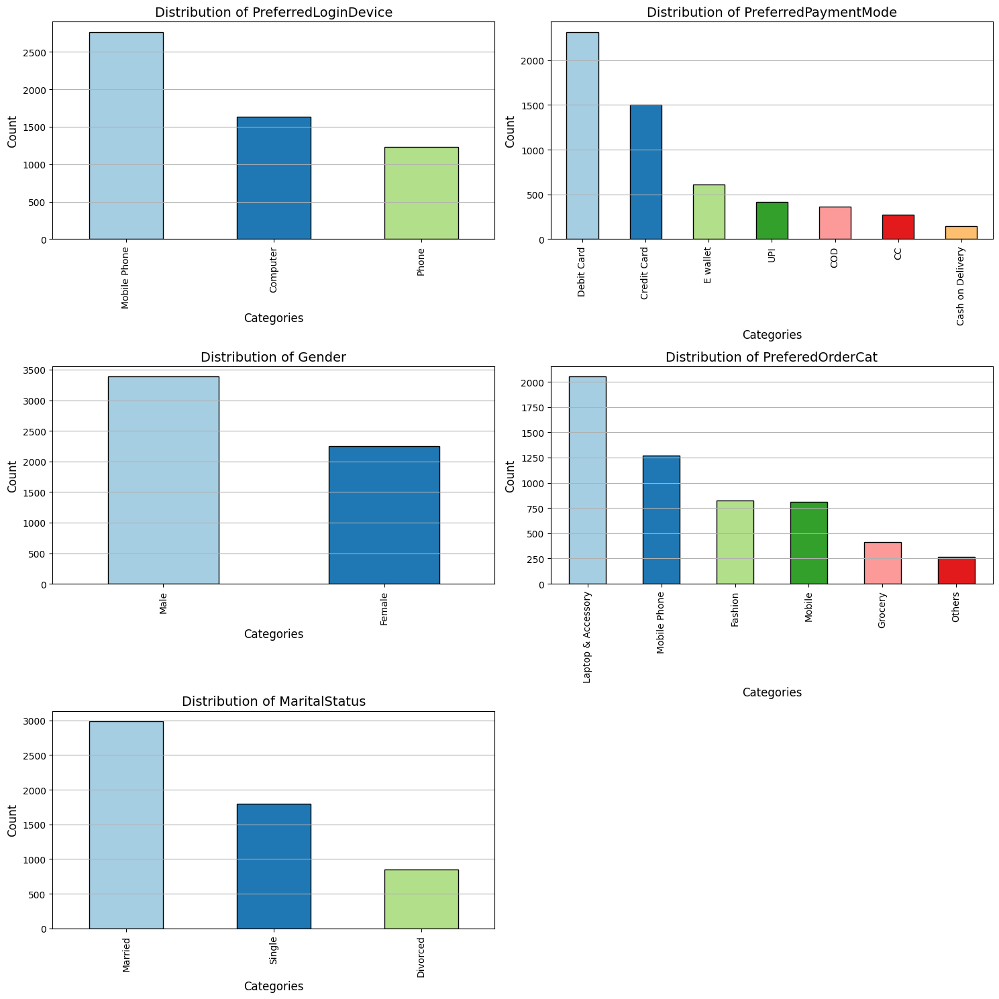

In [5]:
categorical_features = df.select_dtypes(include=['object']).columns
num_plots = len(categorical_features)
num_rows = 3
num_cols = 2

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

for i, feature in enumerate(categorical_features):
    row, col = divmod(i, num_cols)
    ax = axes[row, col]

    colors = plt.cm.Paired(range(len(df[feature].value_counts())))
    df[feature].value_counts().plot(kind='bar', ax=ax, color=colors, edgecolor='black')

    ax.set_title(f'Distribution of {feature}', fontsize=14)
    ax.set_xlabel('Categories', fontsize=12)
    ax.set_ylabel('Count', fontsize=12)
    ax.grid(axis='y')

if num_plots % 2 != 0:
    fig.delaxes(axes.flatten()[-1])

plt.tight_layout()
plt.show()

Primećuje se da fičer PrefferedPaymentMode ima duplirane vrednosti (par vrednosti CC i CreditCard, kao i par COD i Cash On Delivery). Stoga je potrebno svaki par objediniti u jedinstvenu vrednost.

In [6]:
df.loc[df['PreferredPaymentMode'] == 'COD', 'PreferredPaymentMode' ] = 'Cash on Delivery'   
df.loc[df['PreferredPaymentMode'] == 'CC', 'PreferredPaymentMode' ] = 'Credit Card'

In [7]:
df['PreferredPaymentMode'].value_counts()

Debit Card          2314
Credit Card         1774
E wallet             614
Cash on Delivery     514
UPI                  414
Name: PreferredPaymentMode, dtype: int64

Slično, vrednosti Mobile Phone i Phone fičera PreferredLoginDevice mogu se objediniti u jedinstvenu vrednost.

In [8]:
df.loc[df['PreferredLoginDevice'] == 'Phone', 'PreferredLoginDevice' ] = 'Mobile Phone'
df.loc[df['PreferedOrderCat'] == 'Mobile', 'PreferedOrderCat' ] = 'Mobile Phone'

In [9]:
df['PreferredLoginDevice'].value_counts()

Mobile Phone    3996
Computer        1634
Name: PreferredLoginDevice, dtype: int64

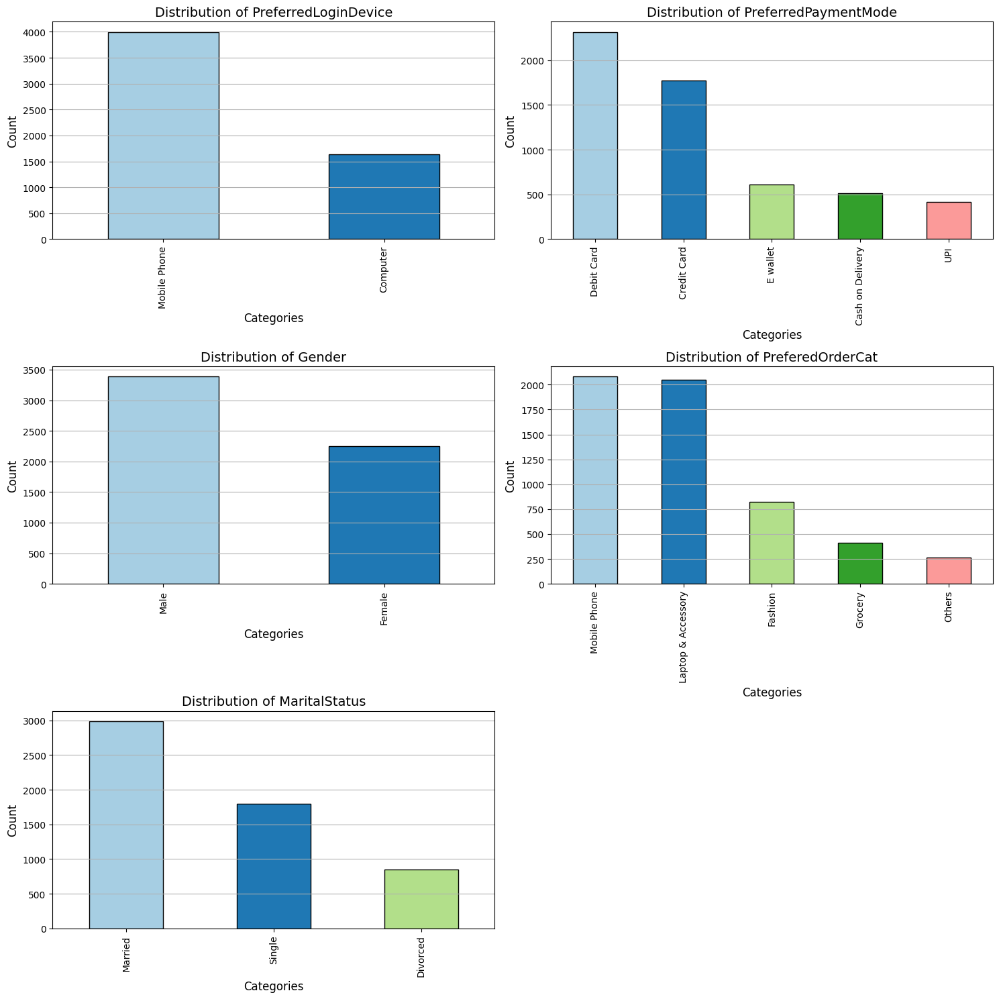

In [10]:
categorical_features = df.select_dtypes(include=['object']).columns
num_plots = len(categorical_features)
num_rows = 3
num_cols = 2

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

for i, feature in enumerate(categorical_features):
    row, col = divmod(i, num_cols)
    ax = axes[row, col]

    colors = plt.cm.Paired(range(len(df[feature].value_counts())))
    df[feature].value_counts().plot(kind='bar', ax=ax, color=colors, edgecolor='black')

    ax.set_title(f'Distribution of {feature}', fontsize=14)
    ax.set_xlabel('Categories', fontsize=12)
    ax.set_ylabel('Count', fontsize=12)
    ax.grid(axis='y')

if num_plots % 2 != 0:
    fig.delaxes(axes.flatten()[-1])

plt.tight_layout()
plt.show()

In [11]:
df.nunique()

CustomerID                     5630
Churn                             2
Tenure                           36
PreferredLoginDevice              2
CityTier                          3
WarehouseToHome                  34
PreferredPaymentMode              5
Gender                            2
HourSpendOnApp                    6
NumberOfDeviceRegistered          6
PreferedOrderCat                  5
SatisfactionScore                 5
MaritalStatus                     3
NumberOfAddress                  15
Complain                          2
OrderAmountHikeFromlastYear      16
CouponUsed                       17
OrderCount                       16
DaySinceLastOrder                22
CashbackAmount                 2586
dtype: int64

### Detekcija duplikata

In [12]:
dupl = df.duplicated()
print('Broj duplikata: %d' % dupl.sum())


Broj duplikata: 0


### Tretman nedostajućih vrednosti

In [14]:
# Procenat nedostajućih vrednosti u svakoj koloni
round((df.isnull().sum()*100 / df.shape[0]),2)

CustomerID                     0.00
Churn                          0.00
Tenure                         4.69
PreferredLoginDevice           0.00
CityTier                       0.00
WarehouseToHome                4.46
PreferredPaymentMode           0.00
Gender                         0.00
HourSpendOnApp                 4.53
NumberOfDeviceRegistered       0.00
PreferedOrderCat               0.00
SatisfactionScore              0.00
MaritalStatus                  0.00
NumberOfAddress                0.00
Complain                       0.00
OrderAmountHikeFromlastYear    4.71
CouponUsed                     4.55
OrderCount                     4.58
DaySinceLastOrder              5.45
CashbackAmount                 0.00
dtype: float64

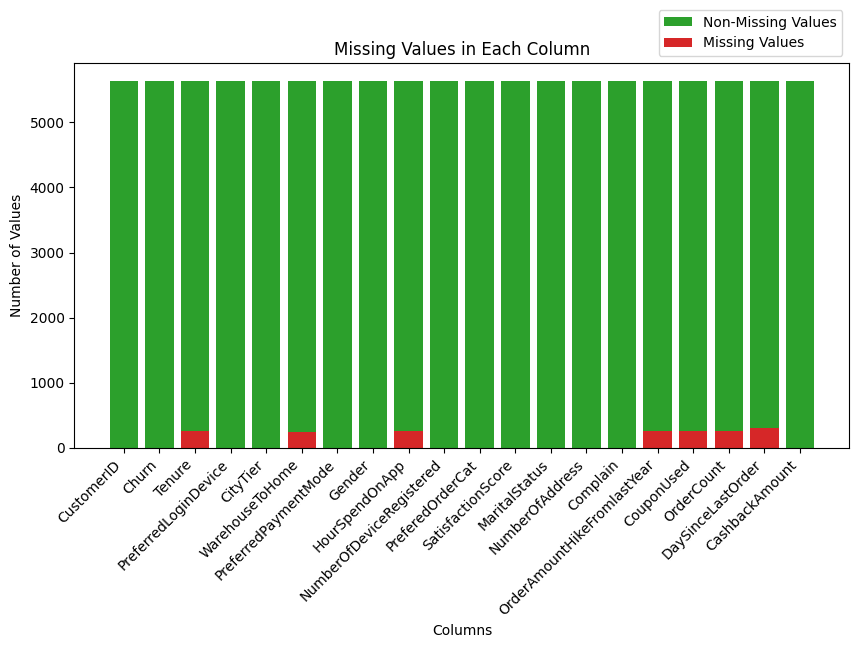

In [15]:
import matplotlib.pyplot as plt
import pandas as pd

total_instances = len(df)
non_null_counts = df.count()

plt.figure(figsize=(10, 5))

plt.bar(non_null_counts.index, total_instances, color="tab:green", label="Non-Missing Values")
plt.bar(non_null_counts.index, total_instances - non_null_counts, color="tab:red", label="Missing Values")

plt.title('Missing Values in Each Column')
plt.xlabel('Columns')
plt.ylabel('Number of Values')
plt.xticks(rotation=45, ha="right")

plt.legend(loc="lower right", bbox_to_anchor=(1, 1))
plt.show()

Sve nedostajuće vrednosti zauzimaju mali udeo u kolonama (manje od 5,5%), stoga ih možemo popuniti.

In [16]:
df['Tenure'] = df['Tenure'].fillna(method = 'bfill')
df['Tenure'].isnull().sum()

0

<AxesSubplot: xlabel='Tenure', ylabel='Density'>

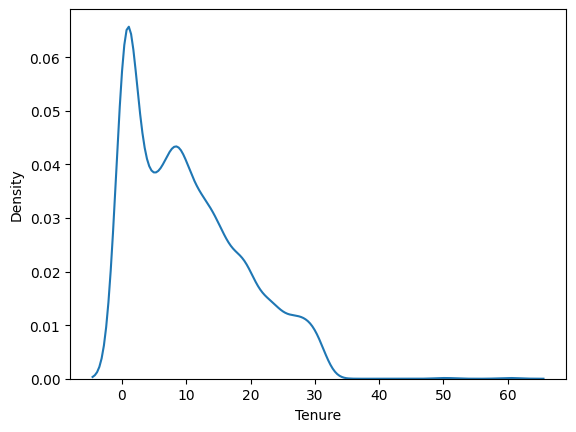

In [17]:
import seaborn as sns 

sns.kdeplot(df , x='Tenure')

In [18]:
df['DaySinceLastOrder'] = df['DaySinceLastOrder'].fillna(method = 'bfill')
df['DaySinceLastOrder'].isnull().sum()

0

<AxesSubplot: xlabel='DaySinceLastOrder', ylabel='Density'>

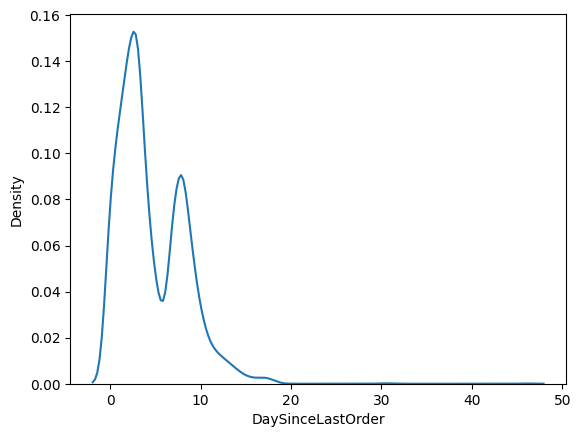

In [19]:
import seaborn as sns 

sns.kdeplot(df , x='DaySinceLastOrder')

In [20]:
from sklearn.impute import SimpleImputer
s_imp = SimpleImputer(missing_values=np.nan , strategy = 'most_frequent')
df['WarehouseToHome'] = s_imp.fit_transform(pd.DataFrame(df['WarehouseToHome']))
df['WarehouseToHome'].isnull().sum()

0

<AxesSubplot: xlabel='WarehouseToHome', ylabel='Density'>

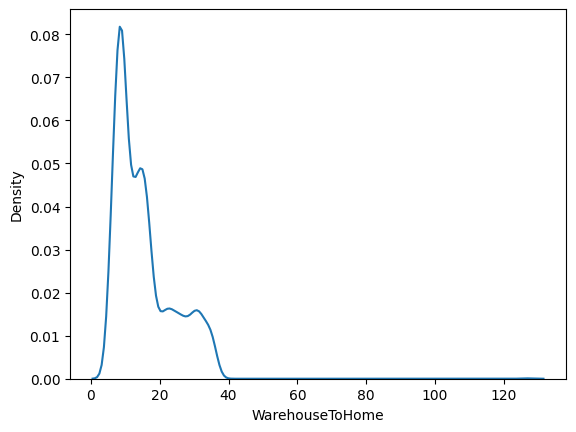

In [21]:
import seaborn as sns 

sns.kdeplot(df , x='WarehouseToHome')

Zamene nedostajućih vrednosti nasumično odabranim vrednostima iz iste kolone.

In [22]:
fill_list = df['HourSpendOnApp'].dropna()
df['HourSpendOnApp'] = df['HourSpendOnApp'].fillna(pd.Series(np.random.choice(fill_list , size = len(df['HourSpendOnApp'].index))))
df['HourSpendOnApp'].isnull().sum()

0

<AxesSubplot: xlabel='HourSpendOnApp', ylabel='Density'>

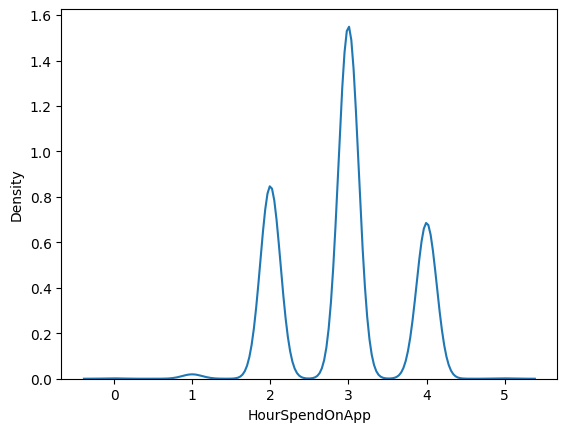

In [23]:
import seaborn as sns 

sns.kdeplot(df , x='HourSpendOnApp')

Forward fill - popunjava nedostajuće vrednosti vrednostima prethodne dostupne celije u istoj koloni.

In [24]:
df['OrderAmountHikeFromlastYear'] = df['OrderAmountHikeFromlastYear'].fillna(method = 'ffill')
df['OrderAmountHikeFromlastYear'].isnull().sum()

0

<AxesSubplot: xlabel='OrderAmountHikeFromlastYear', ylabel='Density'>

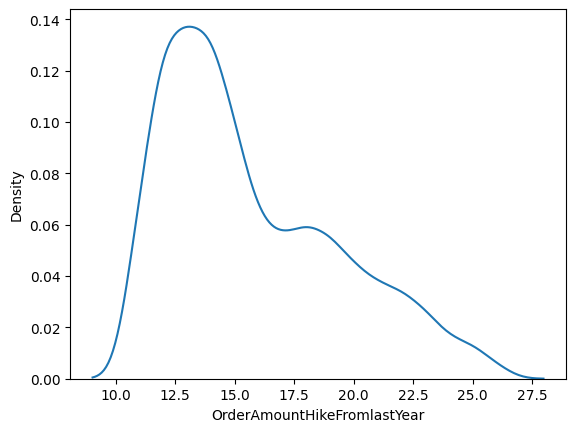

In [25]:
import seaborn as sns 

sns.kdeplot(df , x='OrderAmountHikeFromlastYear')

KKNImputer - za zamenu nedostajućih vrednosti koristiti informacije od dva najbliža suseda. 

Korisna je kada nema jasnog obrasca u nedostajućim podacima i kada je veza između karakteristika nelinearna.

In [26]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=2)
df['CouponUsed']=imputer.fit_transform(df[['CouponUsed']])
df['CouponUsed'].isnull().sum()

0

<AxesSubplot: xlabel='CouponUsed', ylabel='Density'>

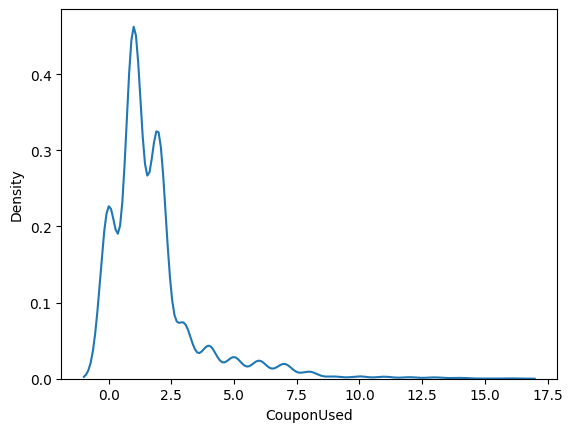

In [27]:
import seaborn as sns 

sns.kdeplot(df , x='CouponUsed')

In [28]:
imputer_2 = KNNImputer(n_neighbors=2)
df['OrderCount']=imputer_2.fit_transform(df[['OrderCount']])
df['OrderCount'].isnull().sum()

0

<AxesSubplot: xlabel='OrderCount', ylabel='Density'>

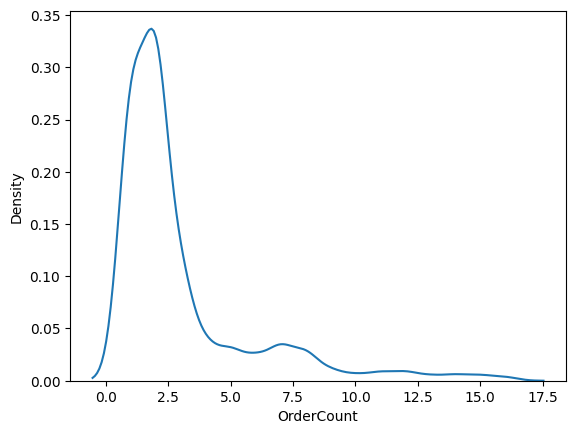

In [29]:
import seaborn as sns 

sns.kdeplot(df , x='OrderCount')

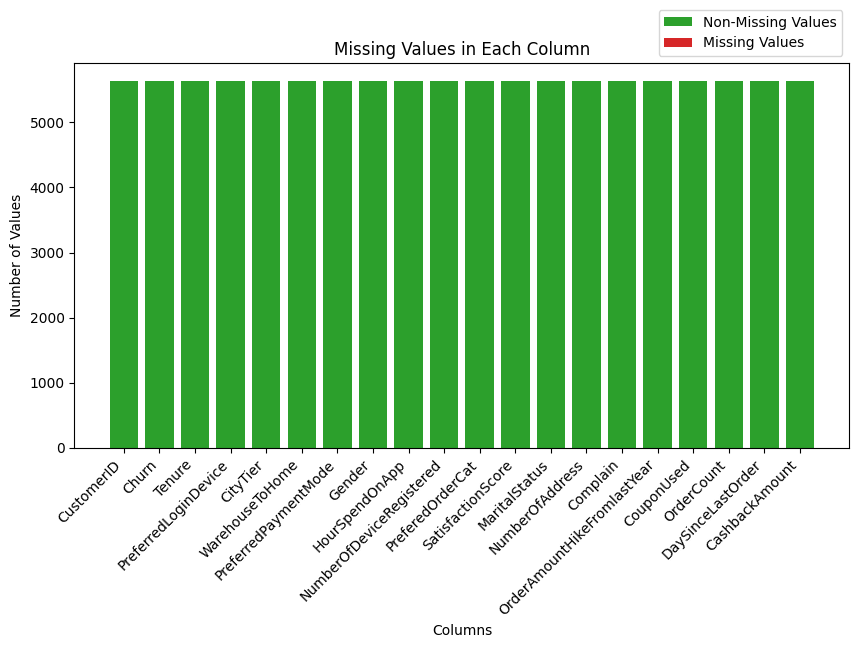

In [30]:
import matplotlib.pyplot as plt
import pandas as pd

total_instances = len(df)
non_null_counts = df.count()

plt.figure(figsize=(10, 5))

plt.bar(non_null_counts.index, total_instances, color="tab:green", label="Non-Missing Values")
plt.bar(non_null_counts.index, total_instances - non_null_counts, color="tab:red", label="Missing Values")

plt.title('Missing Values in Each Column')
plt.xlabel('Columns')
plt.ylabel('Number of Values')
plt.xticks(rotation=45, ha="right")

plt.legend(loc="lower right", bbox_to_anchor=(1, 1))
plt.show()

### Izbacivanje CustomerID kolone

In [31]:
df.drop('CustomerID' , axis = 1 , inplace = True)
df.shape

(5630, 19)

### Provera opsega fičera

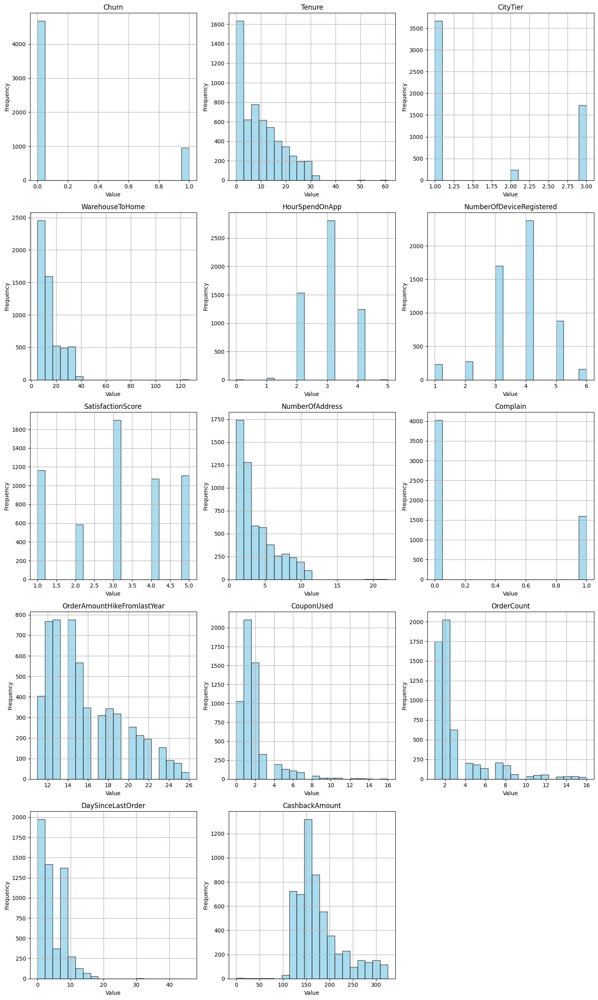

In [36]:
import matplotlib.pyplot as plt

def plot_numerical_feature_distribution(data):
    numerical_features = data.select_dtypes(include=['float64', 'int64'])
    num_features = len(numerical_features.columns)
    num_cols = 3
    num_rows = (num_features + num_cols - 1) // num_cols
    plt.figure(figsize=(15, 5 * num_rows))
    
    for i, col in enumerate(numerical_features.columns, 1):
        plt.subplot(num_rows, num_cols, i)
        data[col].hist(bins=20, color='skyblue', edgecolor='black', alpha=0.7)
        plt.title(col)
        plt.xlabel('Value')
        plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()

plot_numerical_feature_distribution(df)


Na osnovu grafikona raspodele vrednosti po fičerima, zaključuje se da nema potrebe vršiti diskretizaciju (nijedan fičer nema dominantne vrednosti oko nule).

### Tretman Outliera

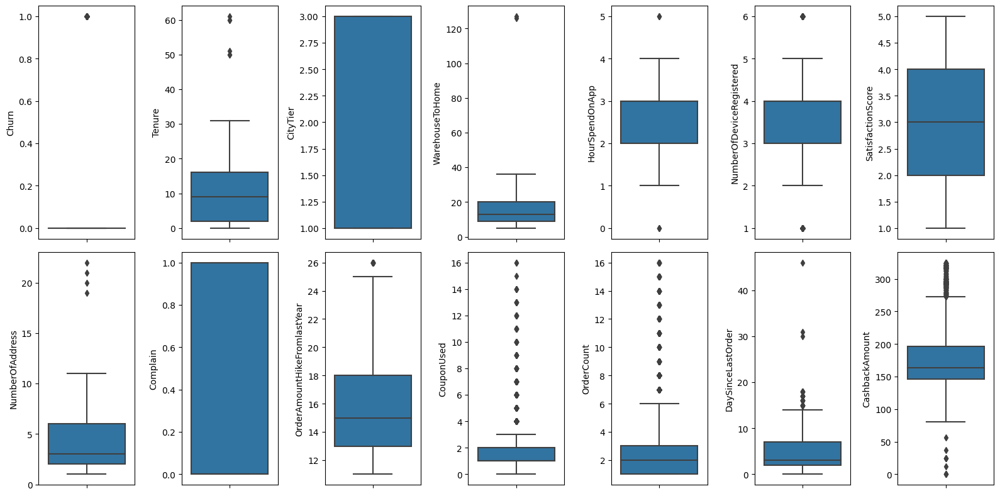

In [37]:
fig, axes = plt.subplots(2, 7, figsize=(16, 8))
numerical_columns = df.select_dtypes(include=['number']).columns

for i, column in enumerate(numerical_columns):
    row = i // 7
    col = i % 7
    sns.boxplot(y=df[column], ax=axes[row, col])

plt.tight_layout()
plt.show()

Z-Score

In [39]:
def remove_outliers_z_score(df, threshold=3):
    features = [col for col in df.columns if col != 'Class']
    z_scores = np.abs((df[features] - df[features].mean()) / df[features].std())
    outliers_mask = z_scores > threshold
    df_cleaned = df[~outliers_mask.any(axis=1)].copy()
    num_outliers_removed = len(df) - len(df_cleaned)
    print(f"Number of outliers removed: {num_outliers_removed}")
    return df_cleaned

Isolation Forest

In [40]:
from sklearn.ensemble import IsolationForest
 
def remove_outliers_isolation_forest(df, contamination=0.1):
    features = [col for col in df.columns if col != 'Class']
    model = IsolationForest(contamination=contamination, n_estimators=100, max_samples=256, max_features=10, random_state=42)
    model.fit(df[features])
    outliers = model.predict(df[features])
    df['Outlier'] = outliers
    df_cleaned = df[df['Outlier'] == 1].drop(columns=['Outlier'])
    num_outliers_removed = len(df) - len(df_cleaned)
    print(num_outliers_removed)
    return df_cleaned

Local Outlier Factor

In [41]:
from sklearn.neighbors import LocalOutlierFactor
 
def remove_outliers_lof(df, contamination=0.1):
    features = [col for col in df.columns if col != 'Class']
    model = LocalOutlierFactor(n_neighbors=20, contamination=contamination)
    outliers = model.fit_predict(df[features])
    df['Outlier'] = outliers
    df_cleaned = df[df['Outlier'] == 1].drop(columns=['Outlier'])
    num_outliers_removed = len(df) - len(df_cleaned)
    print(num_outliers_removed)
    return df_cleaned

IRQ metod

In [42]:
def handle_outliers(df , column_name):
  Q1 = df[column_name].quantile(0.25)
  Q3 = df[column_name].quantile(0.75)
  IQR = Q3 - Q1

  Upper = Q3 + IQR * 1.5
  lower = Q1 - IQR * 1.5

  new_df = df[ (df[column_name] > lower) & (df[column_name] < Upper) ]

  return new_df

df.columns

Index(['Churn', 'Tenure', 'PreferredLoginDevice', 'CityTier',
       'WarehouseToHome', 'PreferredPaymentMode', 'Gender', 'HourSpendOnApp',
       'NumberOfDeviceRegistered', 'PreferedOrderCat', 'SatisfactionScore',
       'MaritalStatus', 'NumberOfAddress', 'Complain',
       'OrderAmountHikeFromlastYear', 'CouponUsed', 'OrderCount',
       'DaySinceLastOrder', 'CashbackAmount'],
      dtype='object')

In [43]:
cols_outliers = ['Tenure' , 'WarehouseToHome' , 'NumberOfAddress' , 'DaySinceLastOrder' , 'HourSpendOnApp' , 'NumberOfDeviceRegistered']

for col in cols_outliers:
    df = handle_outliers(df , col)

df.head(10)

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,159.93
1,1,0.0,Mobile Phone,1,8.0,UPI,Male,3.0,4,Mobile Phone,3,Single,7,1,15.0,0.0,1.0,0.0,120.90
2,1,0.0,Mobile Phone,1,30.0,Debit Card,Male,2.0,4,Mobile Phone,3,Single,6,1,14.0,0.0,1.0,3.0,120.28
3,1,0.0,Mobile Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134.07
4,1,0.0,Mobile Phone,1,12.0,Credit Card,Male,3.0,3,Mobile Phone,5,Single,3,0,11.0,1.0,1.0,3.0,129.60
5,1,0.0,Computer,1,22.0,Debit Card,Female,3.0,5,Mobile Phone,5,Single,2,1,22.0,4.0,6.0,7.0,139.19
6,1,13.0,Mobile Phone,3,11.0,Cash on Delivery,Male,2.0,3,Laptop & Accessory,2,Divorced,4,0,14.0,0.0,1.0,0.0,120.86
7,1,13.0,Mobile Phone,1,6.0,Credit Card,Male,3.0,3,Mobile Phone,2,Divorced,3,1,16.0,2.0,2.0,0.0,122.93
8,1,13.0,Mobile Phone,3,9.0,E wallet,Male,3.0,4,Mobile Phone,3,Divorced,2,1,14.0,0.0,1.0,2.0,126.83
9,1,4.0,Mobile Phone,1,31.0,Debit Card,Male,2.0,5,Mobile Phone,3,Single,2,0,12.0,1.0,1.0,1.0,122.93


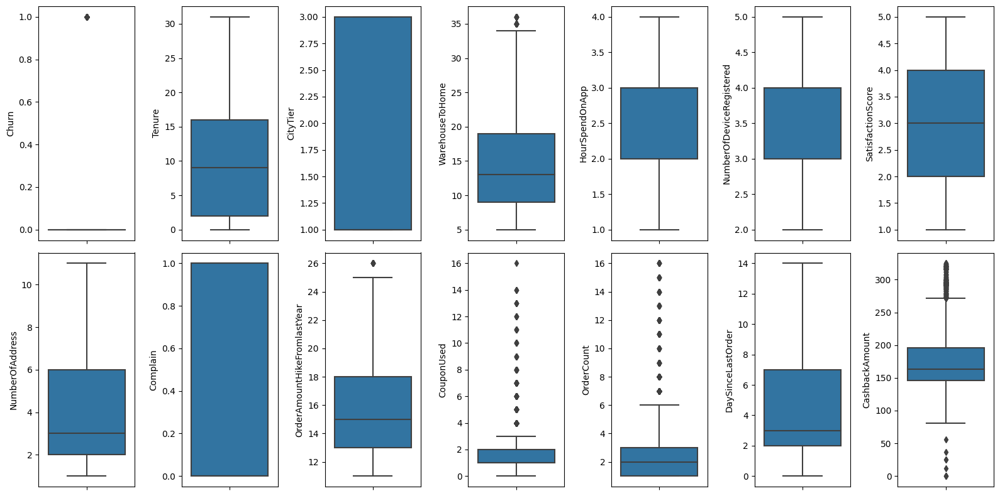

In [44]:
fig, axes = plt.subplots(2, 7, figsize=(16, 8))

for i, column in enumerate(numerical_columns):
    row = i // 7
    col = i % 7
    sns.boxplot(y=df[column], ax=axes[row, col])

plt.tight_layout()
plt.show()

In [45]:
corr_matrix = df.corr()
corr_matrix

,Churn,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
Churn,1.000000,-0.336058,0.069595,0.054768,0.003408,0.079116,0.108600,0.033703,0.252346,-0.002545,-0.017914,-0.036568,-0.164448,-0.165008
Tenure,-0.336058,1.000000,-0.065933,-0.011849,-0.011950,-0.019592,-0.013331,0.240939,-0.023903,0.017177,0.127314,0.181138,0.164444,0.453981
CityTier,0.069595,-0.065933,1.000000,0.014636,-0.013556,0.007282,-0.009735,-0.033363,0.006312,-0.022135,0.017139,0.035656,0.023394,0.044946
WarehouseToHome,0.054768,-0.011849,0.014636,1.000000,0.076143,0.029049,0.013783,0.001173,0.022052,0.028927,0.013175,0.016235,0.044883,0.036318
HourSpendOnApp,0.003408,-0.011950,-0.013556,0.076143,1.000000,0.268016,0.026118,0.134205,0.001538,0.101769,0.178851,0.103203,0.083599,0.113330
NumberOfDeviceRegistered,0.079116,-0.019592,0.007282,0.029049,0.268016,1.000000,-0.001042,0.071084,-0.002056,0.061287,0.135974,0.092487,0.026054,0.120031
SatisfactionScore,0.108600,-0.013331,-0.009735,0.013783,0.026118,-0.001042,1.000000,0.052405,-0.028580,-0.021519,0.012302,0.011932,-0.000683,0.002783
NumberOfAddress,0.033703,0.240939,-0.033363,0.001173,0.134205,0.071084,0.052405,1.000000,-0.026825,0.019536,0.042386,-0.002163,-0.065497,0.193594
Complain,0.252346,-0.023903,0.006312,0.022052,0.001538,-0.002056,-0.028580,-0.026825,1.000000,-0.006918,0.001597,-0.007213,-0.029606,0.001805
OrderAmountHikeFromlastYear,-0.002545,0.017177,-0.022135,0.028927,0.101769,0.061287,-0.021519,0.019536,-0.006918,1.000000,0.030581,0.034175,0.006091,0.039634


<AxesSubplot: >

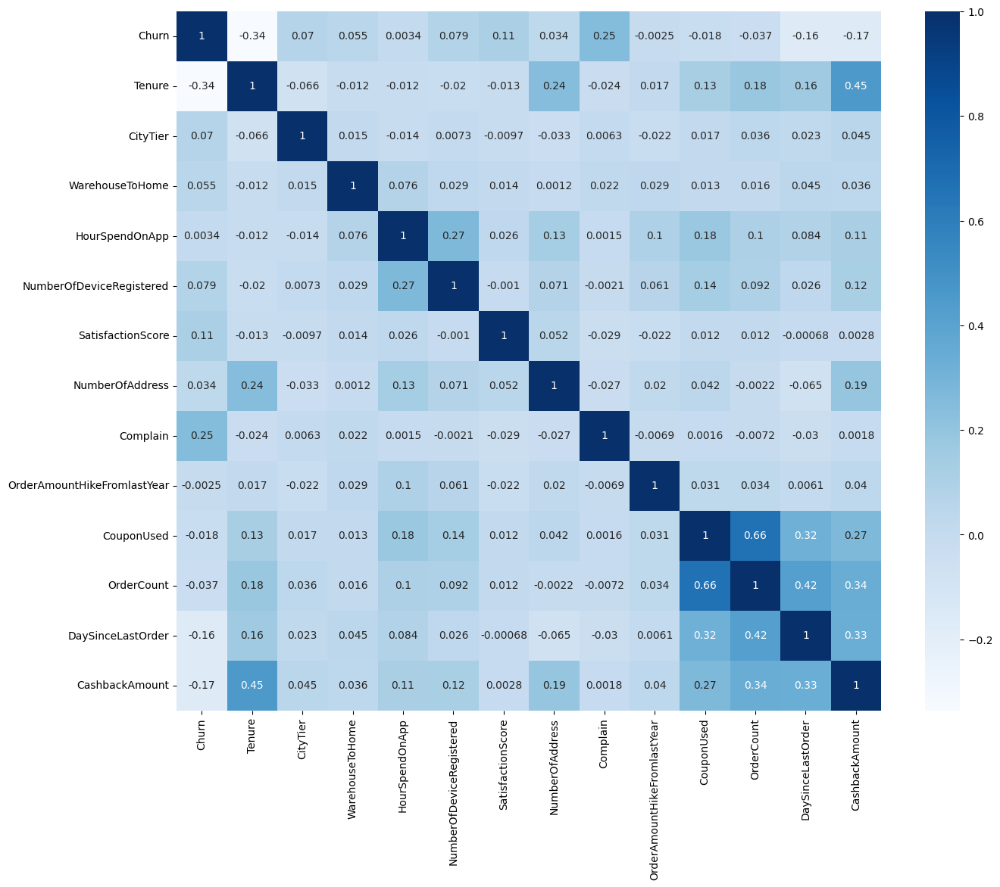

In [46]:
plt.figure(figsize = (15,12))
sns.heatmap(df.corr() , annot = True , cmap = 'Blues')

### Kodiranje kategoričkih fičera

In [47]:
data = df[df.select_dtypes(exclude=np.number).columns]
data

,PreferredLoginDevice,PreferredPaymentMode,Gender,PreferedOrderCat,MaritalStatus
0,Mobile Phone,Debit Card,Female,Laptop & Accessory,Single
1,Mobile Phone,UPI,Male,Mobile Phone,Single
2,Mobile Phone,Debit Card,Male,Mobile Phone,Single
3,Mobile Phone,Debit Card,Male,Laptop & Accessory,Single
4,Mobile Phone,Credit Card,Male,Mobile Phone,Single
...,...,...,...,...,...
5625,Computer,Credit Card,Male,Laptop & Accessory,Married
5626,Mobile Phone,Credit Card,Male,Fashion,Married
5627,Mobile Phone,Debit Card,Male,Laptop & Accessory,Married
5628,Computer,Credit Card,Male,Laptop & Accessory,Married


Za fičere kod kojih se uočava jasan i prirodan redosled medju vrednostima, kao što je to slučaj kod Gender, PreferredLoginDevice i MaritalStatus, biće korišćen Label Encoder u svrhu kodiranja.  

In [48]:
from sklearn.calibration import LabelEncoder

le = LabelEncoder()
columns=['PreferredLoginDevice', 'Gender', 'MaritalStatus']

for i in columns:
  if df[i].dtype == 'object':
    df[i] = le.fit_transform(df[i])

df.head(10)

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,1,4.0,1,3,6.0,Debit Card,0,3.0,3,Laptop & Accessory,2,2,9,1,11.0,1.0,1.0,5.0,159.93
1,1,0.0,1,1,8.0,UPI,1,3.0,4,Mobile Phone,3,2,7,1,15.0,0.0,1.0,0.0,120.90
2,1,0.0,1,1,30.0,Debit Card,1,2.0,4,Mobile Phone,3,2,6,1,14.0,0.0,1.0,3.0,120.28
3,1,0.0,1,3,15.0,Debit Card,1,2.0,4,Laptop & Accessory,5,2,8,0,23.0,0.0,1.0,3.0,134.07
4,1,0.0,1,1,12.0,Credit Card,1,3.0,3,Mobile Phone,5,2,3,0,11.0,1.0,1.0,3.0,129.60
5,1,0.0,0,1,22.0,Debit Card,0,3.0,5,Mobile Phone,5,2,2,1,22.0,4.0,6.0,7.0,139.19
6,1,13.0,1,3,11.0,Cash on Delivery,1,2.0,3,Laptop & Accessory,2,0,4,0,14.0,0.0,1.0,0.0,120.86
7,1,13.0,1,1,6.0,Credit Card,1,3.0,3,Mobile Phone,2,0,3,1,16.0,2.0,2.0,0.0,122.93
8,1,13.0,1,3,9.0,E wallet,1,3.0,4,Mobile Phone,3,0,2,1,14.0,0.0,1.0,2.0,126.83
9,1,4.0,1,1,31.0,Debit Card,1,2.0,5,Mobile Phone,3,2,2,0,12.0,1.0,1.0,1.0,122.93


S druge strane, za preostale kategoričke fičere, PrefferedPaymentMode i PreferedOrderCat, biće korišćen One Hot Encoding, s obzirom da ne postoji prirodan redosled medju kategorijama vrednosti ovih fičera.

In [49]:
df = pd.get_dummies(df, columns=['PreferredPaymentMode', 'PreferedOrderCat'])

df.head(10)

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,Gender,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,MaritalStatus,...,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,PreferedOrderCat_Fashion,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others
0,1,4.0,1,3,6.0,0,3.0,3,2,2,...,0,0,1,0,0,0,0,1,0,0
1,1,0.0,1,1,8.0,1,3.0,4,3,2,...,0,0,0,0,1,0,0,0,1,0
2,1,0.0,1,1,30.0,1,2.0,4,3,2,...,0,0,1,0,0,0,0,0,1,0
3,1,0.0,1,3,15.0,1,2.0,4,5,2,...,0,0,1,0,0,0,0,1,0,0
4,1,0.0,1,1,12.0,1,3.0,3,5,2,...,0,1,0,0,0,0,0,0,1,0
5,1,0.0,0,1,22.0,0,3.0,5,5,2,...,0,0,1,0,0,0,0,0,1,0
6,1,13.0,1,3,11.0,1,2.0,3,2,0,...,1,0,0,0,0,0,0,1,0,0
7,1,13.0,1,1,6.0,1,3.0,3,2,0,...,0,1,0,0,0,0,0,0,1,0
8,1,13.0,1,3,9.0,1,3.0,4,3,0,...,0,0,0,1,0,0,0,0,1,0
9,1,4.0,1,1,31.0,1,2.0,5,3,2,...,0,0,1,0,0,0,0,0,1,0


In [50]:
df.dtypes

Churn                                      int64
Tenure                                   float64
PreferredLoginDevice                       int32
CityTier                                   int64
WarehouseToHome                          float64
Gender                                     int32
HourSpendOnApp                           float64
NumberOfDeviceRegistered                   int64
SatisfactionScore                          int64
MaritalStatus                              int32
NumberOfAddress                            int64
Complain                                   int64
OrderAmountHikeFromlastYear              float64
CouponUsed                               float64
OrderCount                               float64
DaySinceLastOrder                        float64
CashbackAmount                           float64
PreferredPaymentMode_Cash on Delivery      uint8
PreferredPaymentMode_Credit Card           uint8
PreferredPaymentMode_Debit Card            uint8
PreferredPaymentMode

## Klasterizacija

### Skaliranje

In [51]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

scaler = StandardScaler()
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

df.describe()

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,Gender,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,MaritalStatus,...,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,PreferedOrderCat_Fashion,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others
count,5.155000e+03,5.155000e+03,5.155000e+03,5.155000e+03,5.155000e+03,5.155000e+03,5.155000e+03,5.155000e+03,5.155000e+03,5.155000e+03,...,5.155000e+03,5.155000e+03,5.155000e+03,5.155000e+03,5.155000e+03,5.155000e+03,5.155000e+03,5.155000e+03,5.155000e+03,5.155000e+03
mean,-7.443125e-17,6.616111e-17,1.071672e-16,-1.371465e-16,9.924166e-17,-9.751872e-17,-2.205370e-16,-8.821481e-17,1.654028e-17,9.924166e-17,...,1.550651e-17,8.339056e-17,3.687103e-17,-3.101302e-17,-3.790480e-17,7.270830e-17,-2.067535e-18,-2.722254e-17,-3.962775e-18,-2.825631e-17
std,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,...,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00
min,-4.484103e-01,-1.202189e+00,-1.561717e+00,-7.193568e-01,-1.262534e+00,-1.219317e+00,-2.694711e+00,-2.180469e+00,-1.500199e+00,-1.745178e+00,...,-3.182144e-01,-6.790934e-01,-8.290945e-01,-3.543245e-01,-2.817004e-01,-4.203237e-01,-2.731849e-01,-7.576581e-01,-7.665633e-01,-2.185503e-01
25%,-4.484103e-01,-9.648137e-01,-1.561717e+00,-7.193568e-01,-7.703713e-01,-1.219317e+00,-1.306559e+00,-9.272282e-01,-7.734321e-01,-2.497670e-01,...,-3.182144e-01,-6.790934e-01,-8.290945e-01,-3.543245e-01,-2.817004e-01,-4.203237e-01,-2.731849e-01,-7.576581e-01,-7.665633e-01,-2.185503e-01
50%,-4.484103e-01,-1.339987e-01,6.403210e-01,-7.193568e-01,-2.782082e-01,8.201312e-01,8.159263e-02,3.260128e-01,-4.666533e-02,-2.497670e-01,...,-3.182144e-01,-6.790934e-01,-8.290945e-01,-3.543245e-01,-2.817004e-01,-4.203237e-01,-2.731849e-01,-7.576581e-01,-7.665633e-01,-2.185503e-01
75%,-4.484103e-01,6.968163e-01,6.403210e-01,1.461987e+00,4.600364e-01,8.201312e-01,8.159263e-02,3.260128e-01,6.801014e-01,1.245644e+00,...,-3.182144e-01,1.472552e+00,1.206135e+00,-3.543245e-01,-2.817004e-01,-4.203237e-01,-2.731849e-01,1.319857e+00,1.304524e+00,-2.185503e-01
max,2.230101e+00,2.477134e+00,6.403210e-01,1.461987e+00,2.551730e+00,8.201312e-01,1.469745e+00,1.579254e+00,1.406868e+00,1.245644e+00,...,3.142535e+00,1.472552e+00,1.206135e+00,2.822272e+00,3.549871e+00,2.379119e+00,3.660525e+00,1.319857e+00,1.304524e+00,4.575606e+00


### K-Means

#### Procena i izbor optimalnog broja klastera 

U svrhu izbora optimalnog broja klastera, upotrebljene su dve metode: Elbow metoda i Silhouette koeficijent

##### Elbow metoda

In [52]:
from sklearn.cluster import KMeans

kmeans_kwargs = {
     "init": "random",
     "n_init": 10,
     "max_iter": 300,
     "random_state": 42,
 }

sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(df)
    sse.append(kmeans.inertia_)

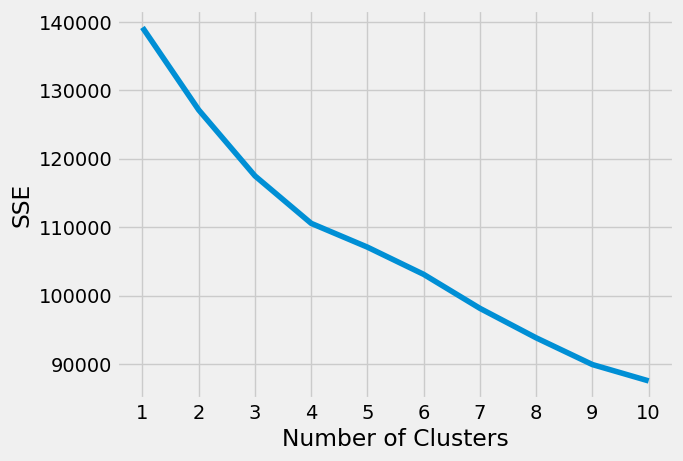

In [53]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [54]:
from kneed import KneeLocator

kl = KneeLocator(range(1, 11), sse, curve="convex", direction="decreasing")
kl.elbow

4

Elbow metoda daje procenu da je 4 optimalan broj klastera.

##### Silhouette koeficijent

In [55]:
from sklearn.metrics import silhouette_score

silhouette_coefficients = []

for k in range(2, 10):
    kmeans = KMeans(n_clusters=k,  random_state=42)
    kmeans.fit(df)
    score = silhouette_score(df, kmeans.labels_)
    silhouette_coefficients.append(score)

In [56]:
print(silhouette_coefficients)

[0.07650486111835252, 0.08911255779370082, 0.11225260438060401, 0.11484286806452718, 0.1347703104599949, 0.12091051533298725, 0.11682859860712451, 0.1193316146052179]


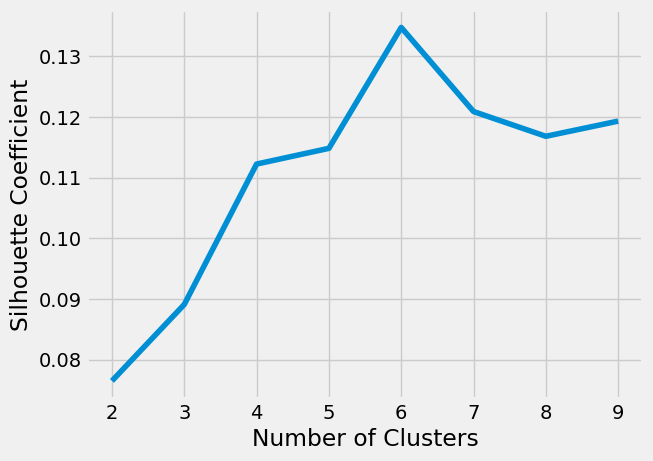

In [57]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 10), silhouette_coefficients)
plt.xticks(range(2, 10))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

Silhouette koeficijent ima najveću vrednost za 6 klastera, te zaključujemo da je po ovoj metodi to optimalan broj.

#### Procena i izbor optimalnog broja klastera - yellowbrick

In [58]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

def elbowDist(df: pd.DataFrame):
    elbow = KElbowVisualizer(KMeans(), k=(2,12))
    elbow.fit(df)
    elbow.show()

In [193]:
#elbowDist(df)

In [59]:
def elbowCH(df: pd.DataFrame):
    elbow = KElbowVisualizer(KMeans(), k=(2,12), metric='calinski_harabasz')
    elbow.fit(df)
    elbow.show()

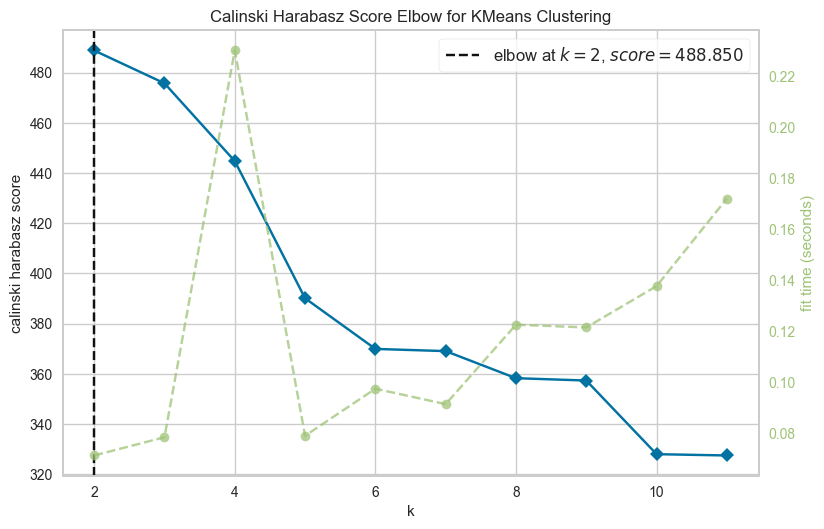

In [60]:
elbowCH(df)

Jasno se vidi da je po Calinski Harabasz metrici optimalan broj klastera 2.

In [61]:
def elbowSil(df: pd.DataFrame):
    elbow = KElbowVisualizer(KMeans(), k=(2,12), metric='silhouette')
    elbow.fit(df)
    elbow.show()

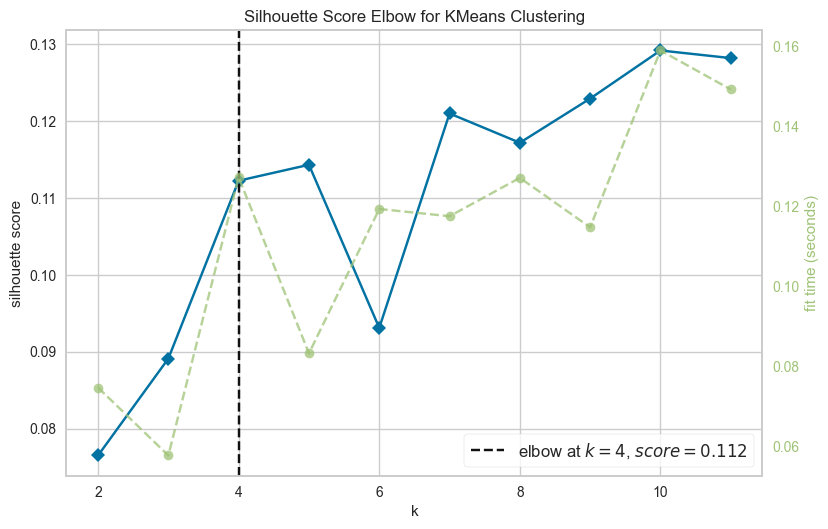

In [62]:
elbowSil(df)

Po Silhouette skoru, optimalan broj klastera je 4.

#### PCA predobrada

U slučajevima kada nema koncentracije podataka ili jasne separacije po grupama, preporučuje se pokušaj smanjenja dimenzija podataka pomoću PCA metode.

In [63]:
from sklearn.decomposition import PCA

pca = PCA(n_components=15)
pca.fit_transform(df)
pca.explained_variance_ratio_.cumsum()

array([0.12070546, 0.19534891, 0.25869771, 0.31693009, 0.36961844,
       0.41895155, 0.46334958, 0.50742287, 0.54959145, 0.59064813,
       0.63039651, 0.66956918, 0.70693897, 0.7432251 , 0.778378  ])

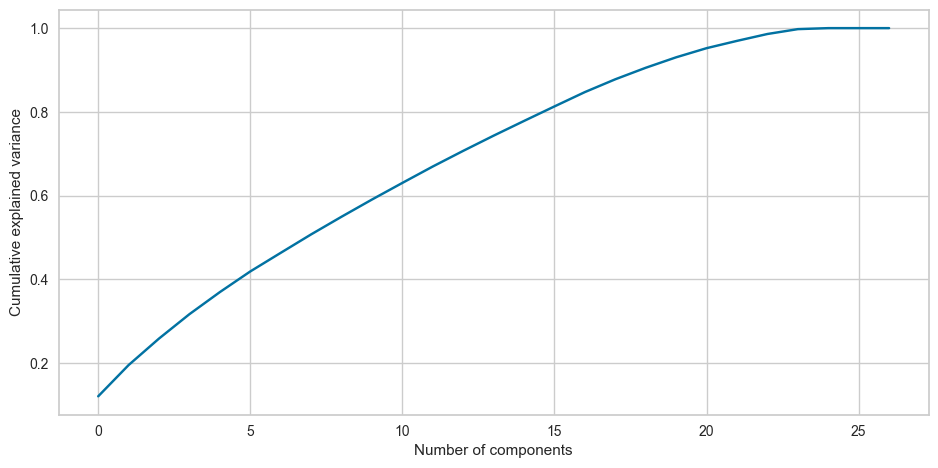

In [64]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(df)
data_pca = pca.transform(df)
plt.figure(figsize=(10, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.show()

S obzirom da prvih 15 PCA dimenzija objašnjava gotovo 80% podataka, opredeljujemo se za primenu PCA sa 15 komponenata.

In [65]:
pca = PCA(n_components=7)
X_pca = pca.fit_transform(df)

#### K-Means - 2 klastera

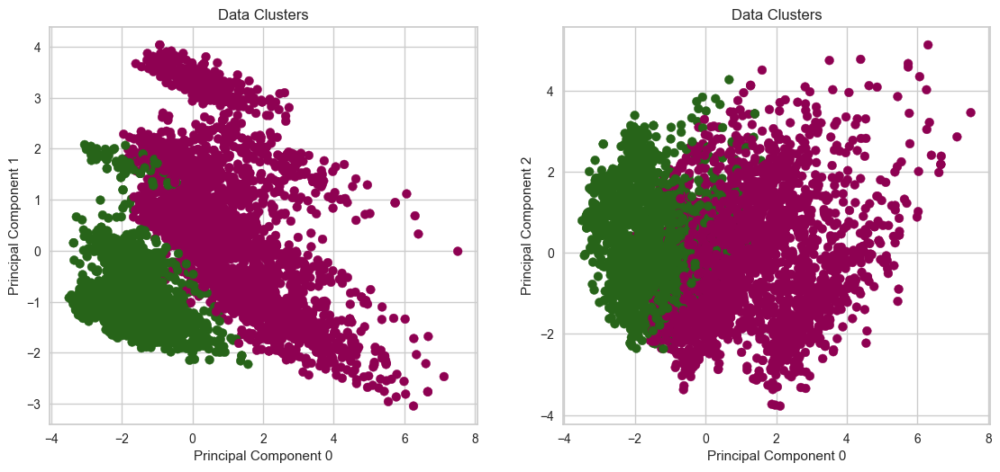

In [66]:
kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(df)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='PiYG', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')

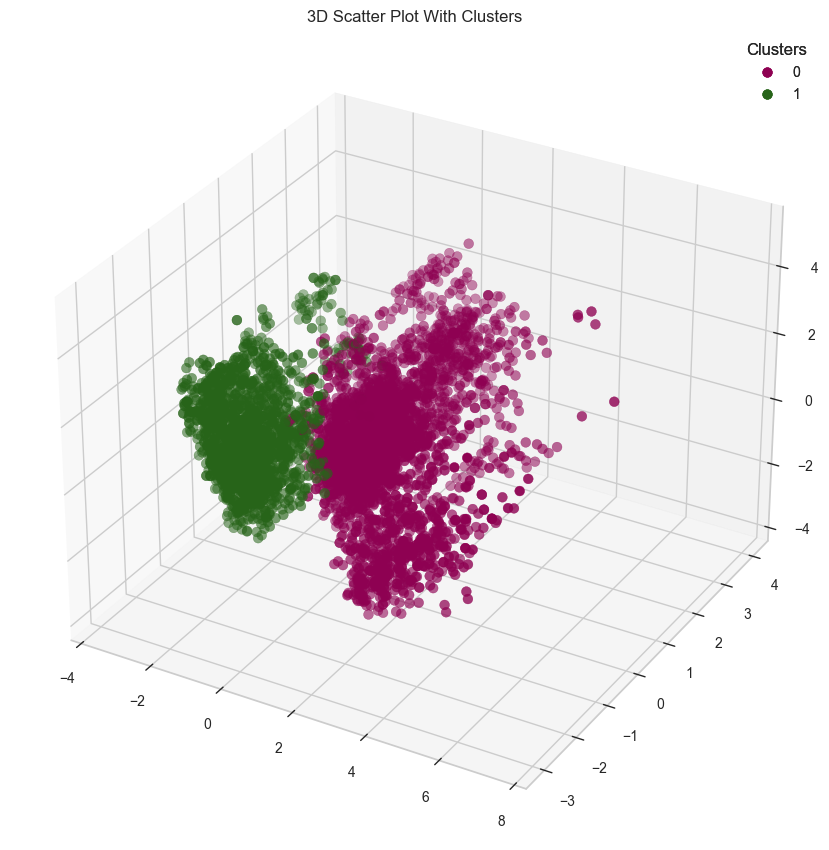

In [67]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='PiYG', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

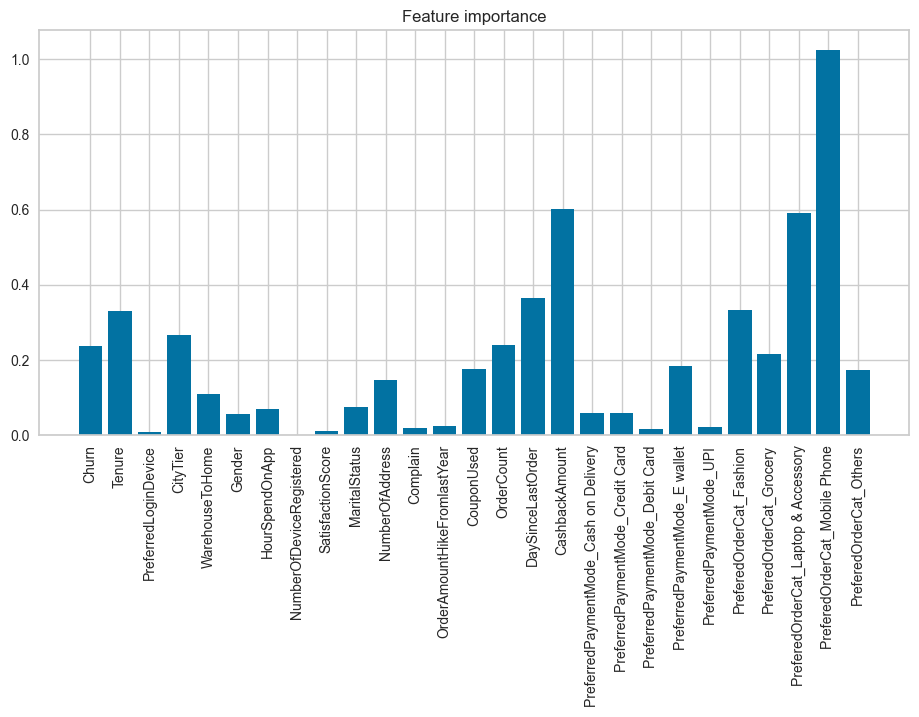

In [68]:
cent = kmeans.cluster_centers_
feature_importance = cent.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance')
plt.show()

In [69]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone'],
      dtype='object')


In [70]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(2)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(2), index=important_columns)

In [71]:
cluster_data

,0,1
Tenure,0.245693,-0.415689
DaySinceLastOrder,0.271999,-0.460198
CashbackAmount,0.447981,-0.757942
PreferedOrderCat_Fashion,0.246704,-0.417400
PreferedOrderCat_Laptop & Accessory,0.440119,-0.744640
PreferedOrderCat_Mobile Phone,-0.762089,1.289383


Klaster 0 - kraće iskustvo sa kompanijom, češće porudžbine, manje povraćaja novca, kupci koji pripadaju ovom klasteru značajno više preferiraju kategoriju Mobilni telefoni <br>
Klaster 1 - duže iskustvo sa kompanijom, redje porudžbine, generalno veći povraćaj novca, osobe koje preferiraju kupovinu proizvoda iz kategorije Fashion and Accessories <br>

##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

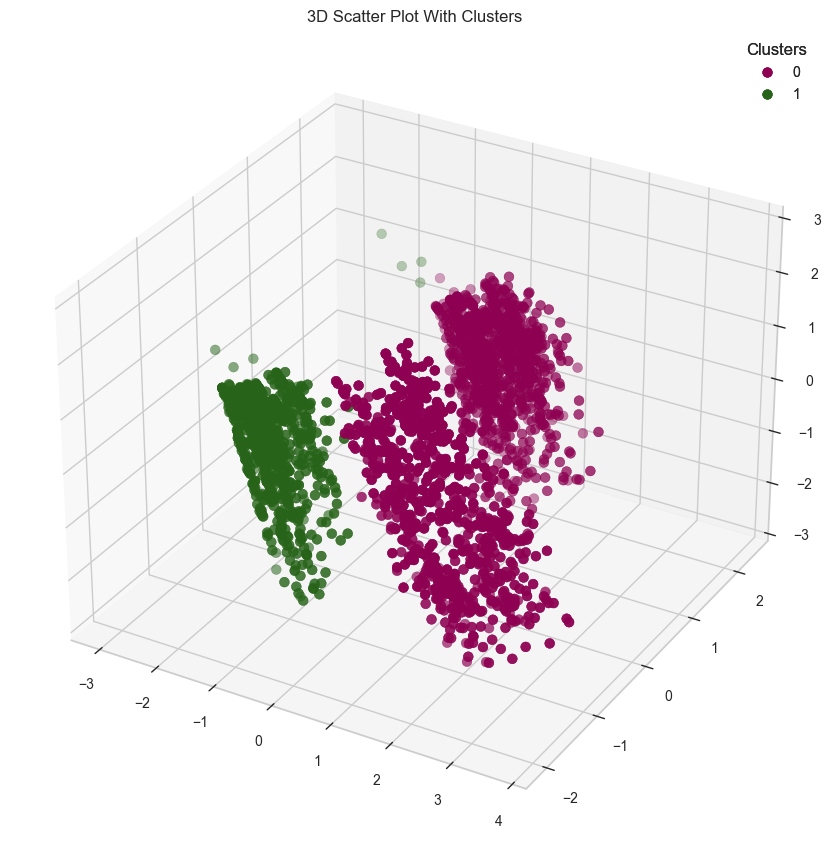

In [74]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


selected_columns = ['Tenure', 'DaySinceLastOrder', 'CashbackAmount', 'PreferedOrderCat_Fashion', 'PreferedOrderCat_Laptop & Accessory','PreferedOrderCat_Mobile Phone']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=5)
X_pca_selected = pca.fit_transform(df_selected)

kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(df_selected)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='PiYG', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

#### K-Means - 4 klastera

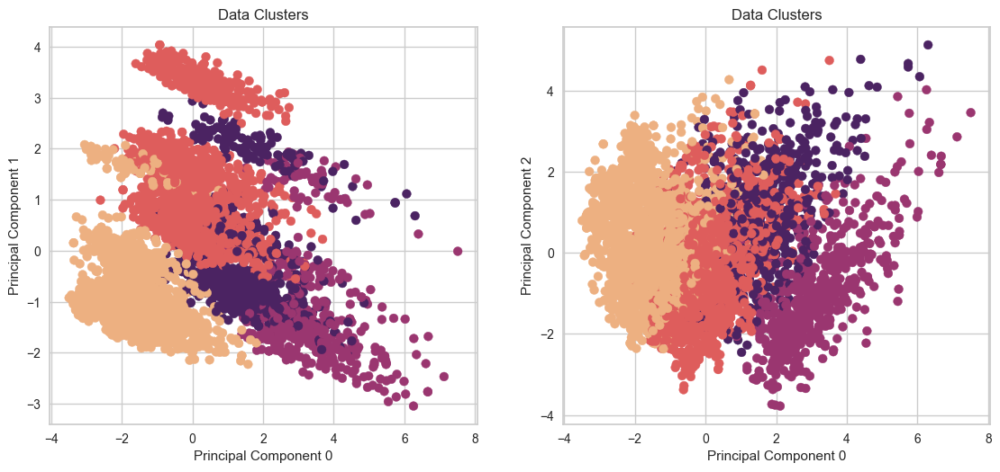

In [75]:
kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(df)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='flare', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')

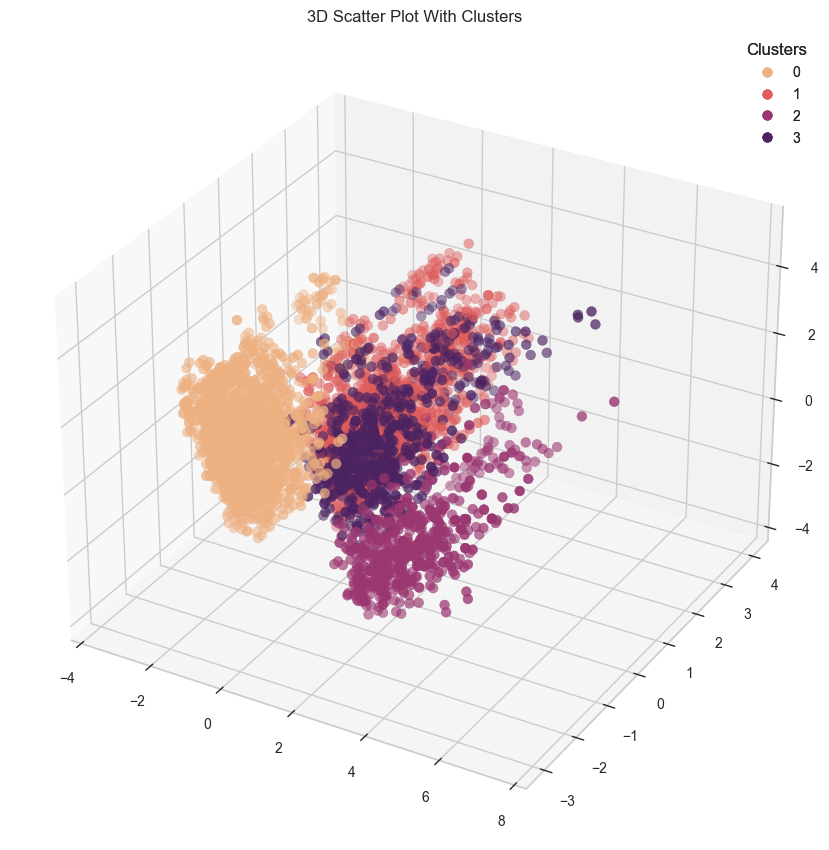

In [76]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='flare', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

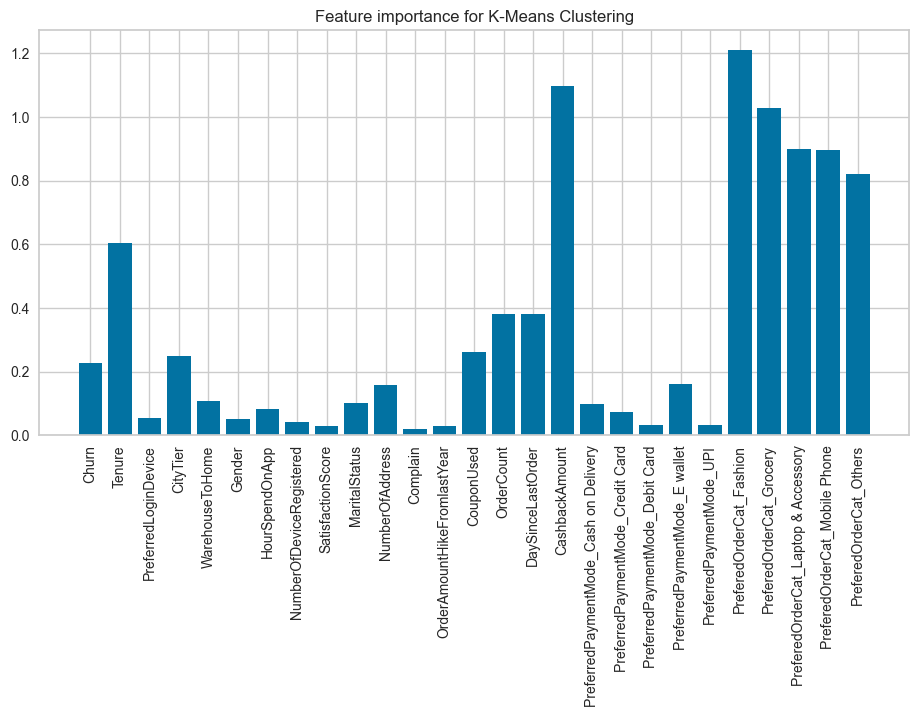

In [77]:
cent = kmeans.cluster_centers_
feature_importance = cent.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for K-Means Clustering')
plt.show()

In [79]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others'],
      dtype='object')


In [80]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(4)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(4), index=important_columns)

In [81]:
cluster_data

,0,1,2,3
Tenure,-0.407702,-0.066511,1.209396,0.240006
OrderCount,-0.292463,-0.075345,0.682673,0.380933
DaySinceLastOrder,-0.451569,0.122616,0.544857,0.397902
CashbackAmount,-0.753149,-0.197664,2.153972,0.686447
PreferedOrderCat_Fashion,-0.420324,-0.420324,-0.420324,2.379119
PreferedOrderCat_Grocery,-0.273185,-0.273185,2.101635,-0.273185
PreferedOrderCat_Laptop & Accessory,-0.757658,1.319857,-0.757658,-0.757658
PreferedOrderCat_Mobile Phone,1.304524,-0.766563,-0.766563,-0.766563
PreferedOrderCat_Others,-0.218550,-0.218550,1.681326,-0.218550


Klaster 0 - kraće iskustvo u kompaniji, manji povraćaj novca, korisnici koji preferiraju kategoriju Mobile Phone <br>
Klaster 1 - duže iskustvo u kompaniji, veći povraćaj novca, korisnici koji značajno više preferiraju kategoriju Fashion <br>
Klaster 2 - duže iskustvo u kompaniji, značajno veći povraćaj novca, korisnici koji značajno više preferiraju kategoriju Grocery/Others <br>
Klaster 3 - (otprilike) srednje iskustvo u kompaniji, mali povraćaj novca, korisnici koji preferiraju kategoriju Laptop & Accessory 

##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

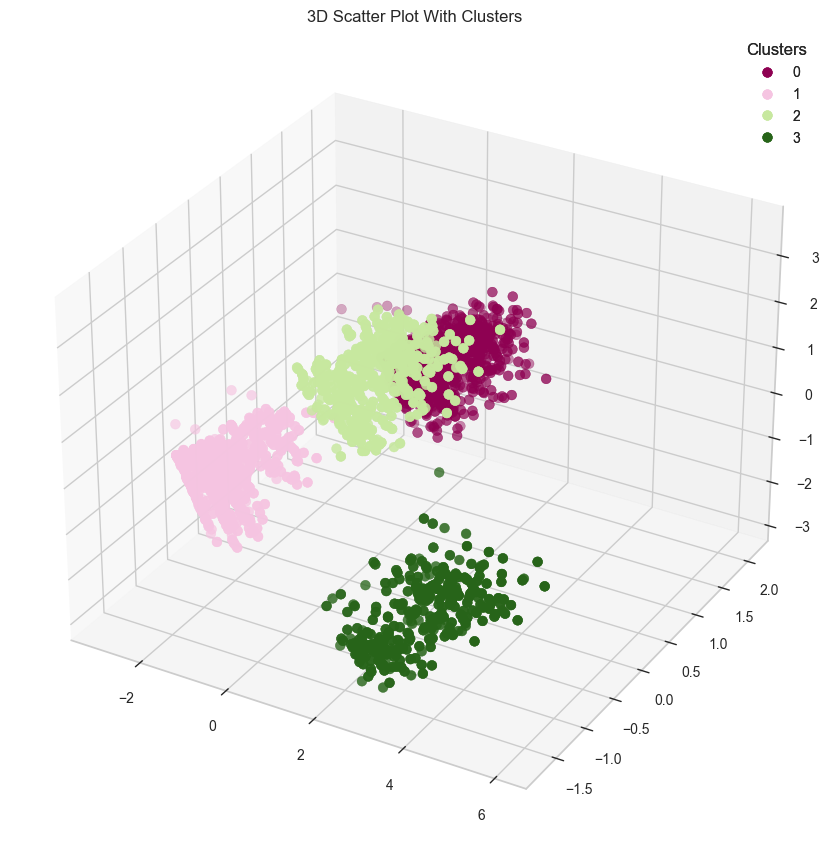

In [82]:
selected_columns = ['Tenure', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=5)
X_pca_selected = pca.fit_transform(df_selected)

kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(df_selected)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='PiYG', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

#### K-Means - 5 klastera

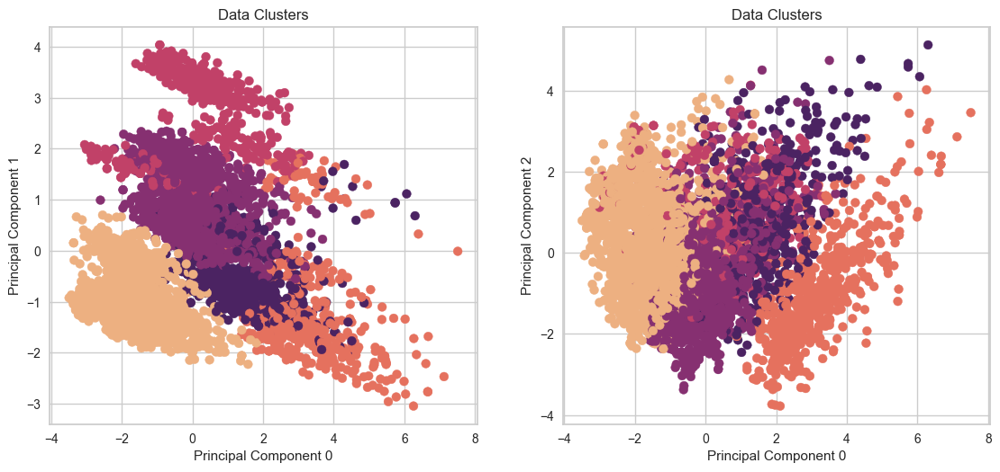

In [83]:
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(df)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='flare', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')

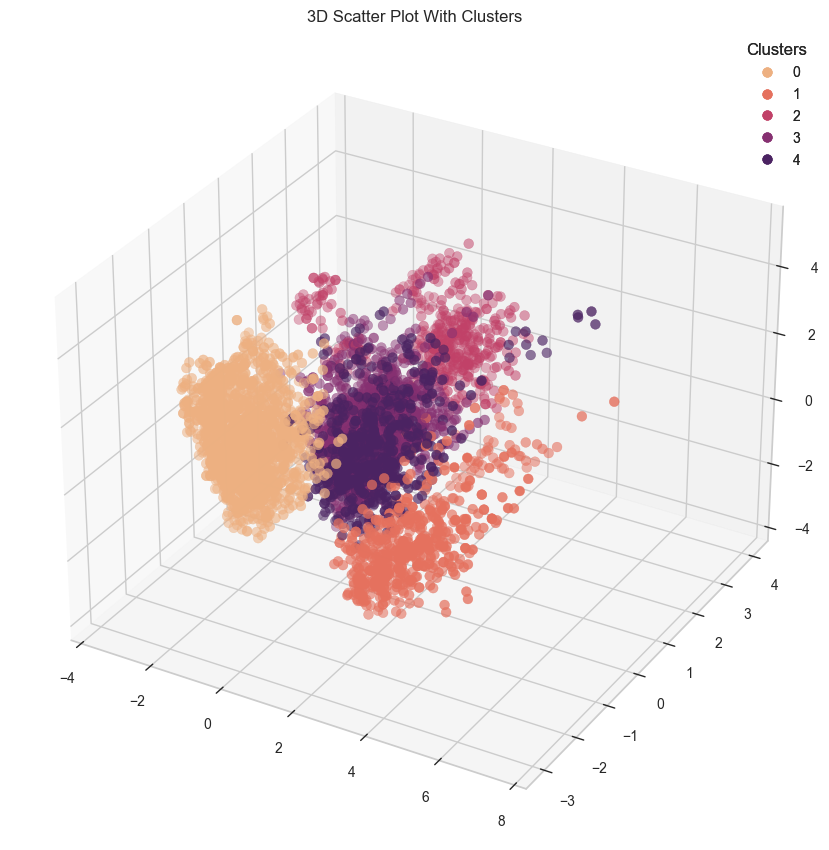

In [84]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='flare', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

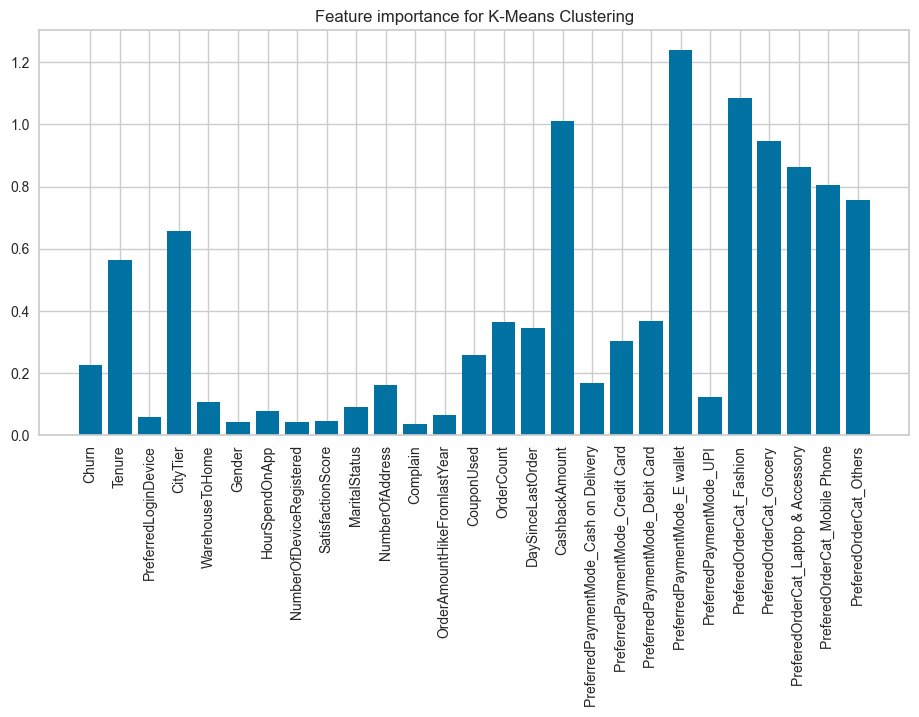

In [85]:
cent = kmeans.cluster_centers_
feature_importance = cent.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for K-Means Clustering')
plt.show()

In [86]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'CityTier', 'OrderCount', 'DaySinceLastOrder',
       'CashbackAmount', 'PreferredPaymentMode_Credit Card',
       'PreferredPaymentMode_Debit Card', 'PreferredPaymentMode_E wallet',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others'],
      dtype='object')


In [87]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(5)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(5), index=important_columns)

In [88]:
cluster_data

,0,1,2,3,4
Tenure,-0.403249,1.225038,-0.146798,-0.049200,0.259545
CityTier,-0.407396,-0.136797,1.461987,0.077350,-0.060033
OrderCount,-0.289264,0.690654,-0.110595,-0.061886,0.418463
DaySinceLastOrder,-0.441765,0.538617,-0.026956,0.153067,0.403522
CashbackAmount,-0.748367,2.160303,-0.068569,-0.211283,0.706864
PreferredPaymentMode_Credit Card,0.105458,0.095646,-0.679093,0.042713,0.045671
PreferredPaymentMode_Debit Card,0.051876,0.046124,-0.829095,0.158552,0.079873
PreferredPaymentMode_E wallet,-0.354325,-0.067021,2.822272,-0.354325,-0.297002
PreferedOrderCat_Fashion,-0.420324,-0.420324,0.177989,-0.420324,2.379119
PreferedOrderCat_Grocery,-0.273185,2.103152,-0.242332,-0.273185,-0.273185


Klaster 0 - kraće iskustvo sa kompanijom, manji povraćaj novca, korisnici koji preferiraju kategoriju Mobile Phone, uglavnom plaćaju karticom <br>
Klaster 1 - duže iskustvo sa kompanijom, značajno veći povraćaj novca, korisnici koji značajno više preferiraju kategoriju Grocery, uglavnom plaćaju karticom <br>
Klaster 2 - (otprilike) srednje iskustvo sa kompanijom, izuzetno veći povraćaj novca, korisnici koji preferiraju kategoriju Laptop & Accessory, uglavnom plaćaju E-novčanikom <br>
Klaster 3 - (otprilike) srednje iskustvo sa kompanijom, srednji povraćaj novca, korisnici koji značajno više preferiraju kategoriju Laptop & Accessory, uglavnom plaćaju karticom <br>
Klaster 4 - duže iskustvo sa kompanijom, veći povraćaj novca, korisnici koji značajno više preferiraju kategoriju Fashion, uglavnom plaćaju karticom 

##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

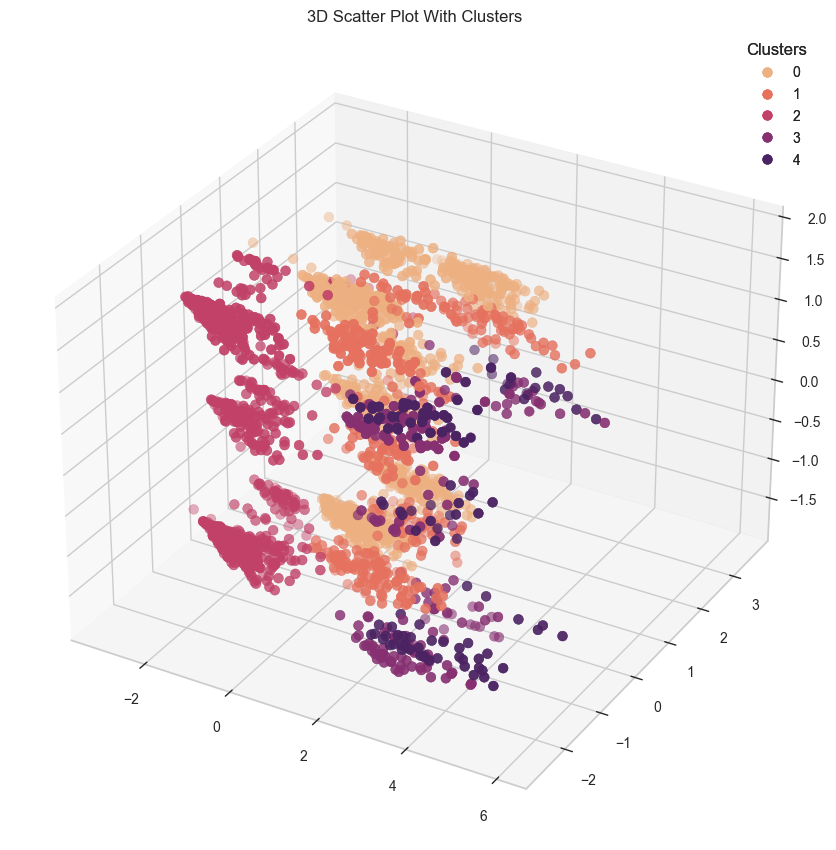

In [89]:
selected_columns = ['Tenure', 'CityTier', 'OrderCount', 'DaySinceLastOrder',
       'CashbackAmount', 'PreferredPaymentMode_Credit Card',
       'PreferredPaymentMode_Debit Card', 'PreferredPaymentMode_E wallet',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=5)
X_pca_selected = pca.fit_transform(df_selected)

kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(df_selected)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='flare', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

### Agglomerative Clustering

#### Procena i izbor optimalnog broja klastera 

In [90]:
from sklearn.cluster import AgglomerativeClustering

# elbow = KElbowVisualizer(AgglomerativeClustering(), k=(2,12))
# elbow.fit(df)
# elbow.show()

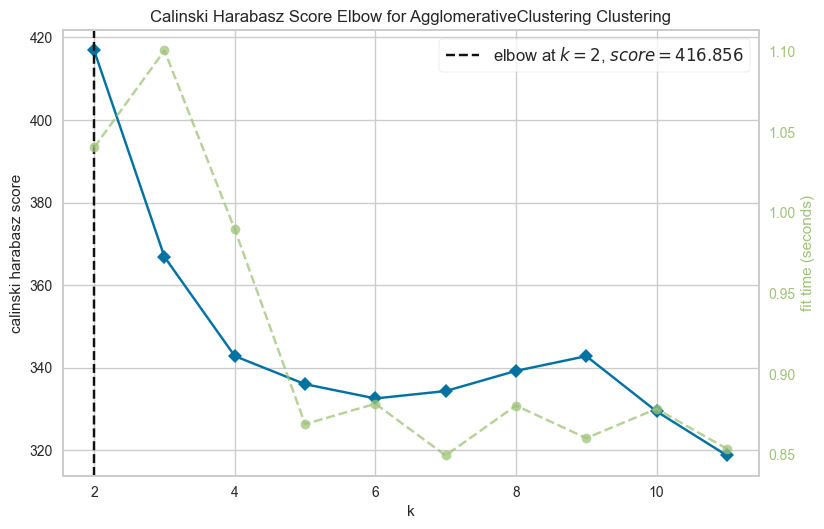

<AxesSubplot: title={'center': 'Calinski Harabasz Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [91]:
elbow = KElbowVisualizer(AgglomerativeClustering(), k=(2,12), metric='calinski_harabasz')
elbow.fit(df)
elbow.show()

Calinski Harabasz metrika procenjuje da je optimalan broj klastera za hijerarhijsku klasterizaciju 2.

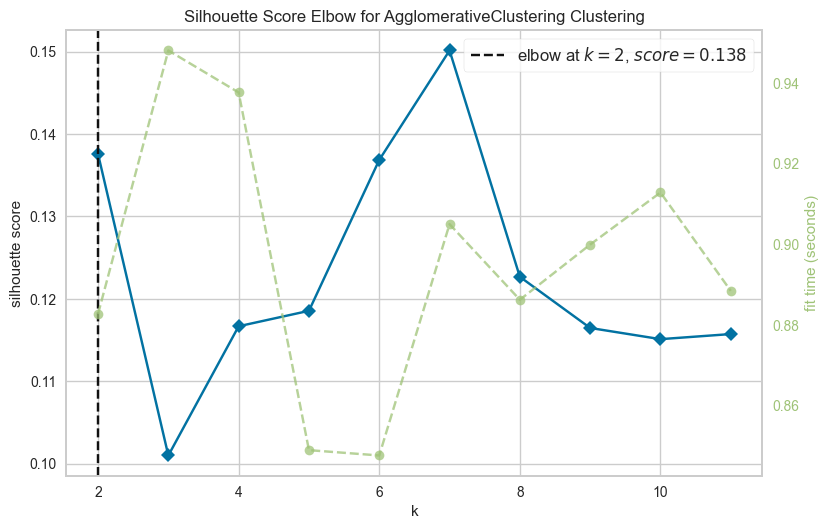

<AxesSubplot: title={'center': 'Silhouette Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='silhouette score'>

In [92]:
elbow = KElbowVisualizer(AgglomerativeClustering(), k=(2,12), metric='silhouette')
elbow.fit(df)
elbow.show()

Slično, silhouette metrika procenjuje da je optimalan broj klastera za hijerarhijsku klasterizaciju 2.

#### Agglomerative - 2 klastera

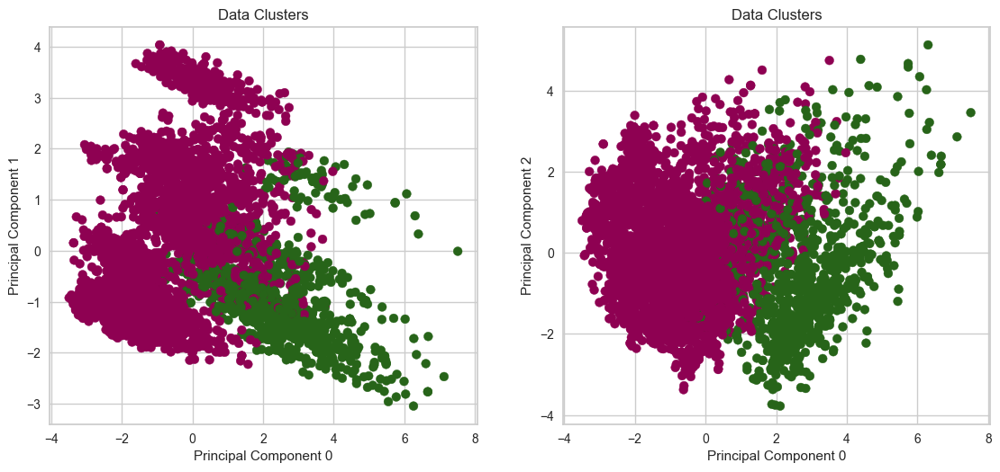

In [93]:
agglomerative = AgglomerativeClustering(n_clusters=2)
clusters = agglomerative.fit_predict(df)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='PiYG', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')

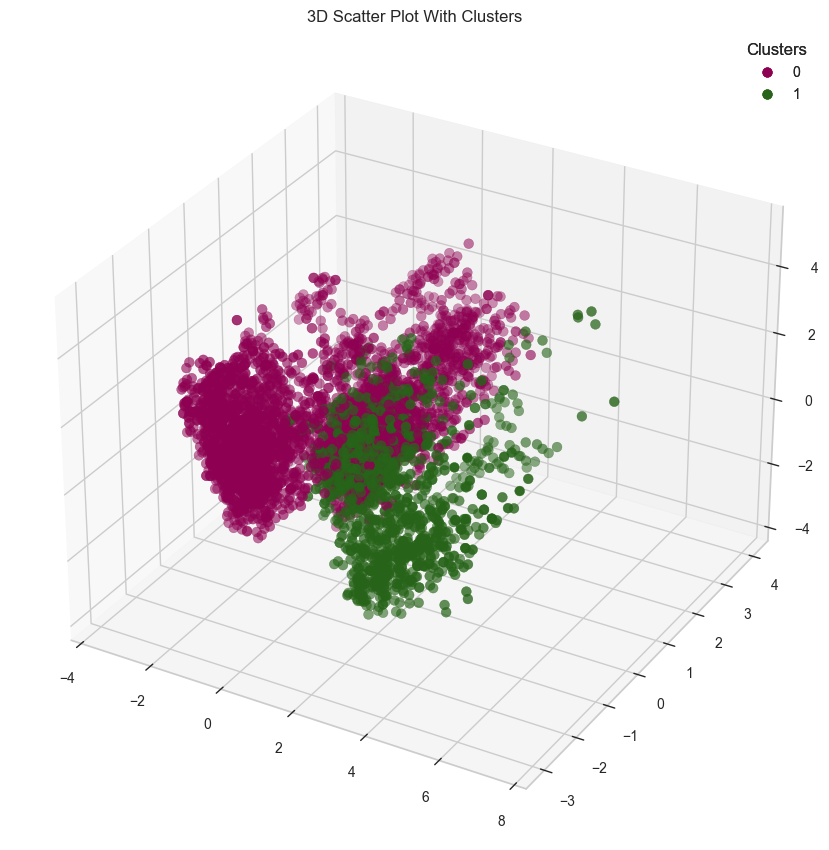

In [94]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='PiYG', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

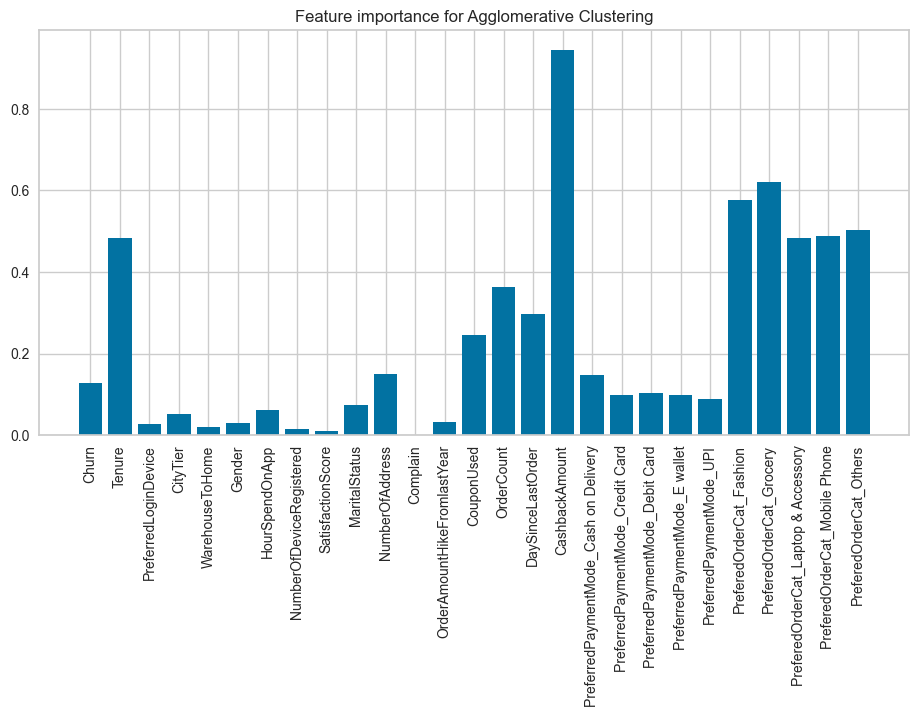

In [95]:
cent = np.array([df.loc[agglomerative.labels_ == label].mean(axis=0) for label in np.unique(agglomerative.labels_)])

feature_importance = cent.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for Agglomerative Clustering')
plt.show()

In [96]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'OrderCount', 'CashbackAmount', 'PreferedOrderCat_Fashion',
       'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others'],
      dtype='object')


In [97]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(2)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(2), index=important_columns)

In [98]:
cluster_data

,0,1
Tenure,-0.210447,0.758174
OrderCount,-0.157515,0.567475
CashbackAmount,-0.410816,1.480037
PreferedOrderCat_Fashion,-0.251039,0.904413
PreferedOrderCat_Grocery,-0.270260,0.973661
PreferedOrderCat_Laptop & Accessory,0.210304,-0.757658
PreferedOrderCat_Mobile Phone,0.212776,-0.766563
PreferedOrderCat_Others,-0.218550,0.787366


Klaster 0 - kraće ukupno iskustvo sa kompanijom, manji/prosečan broj porudžbina, nešto kraći vremenski period od poslednje porudžbine, manji povraćaj novca,  korisnici koji pripadaju ovom klasteru preferiraju kategorije Mobile Phone i Laptop & Accessory <br> 
Klaster 1 - dugačko ukupno iskustvo sa kompanijom, značajno veći broj porudžbina, duži vremenski period od poslednje porudžbine, osobe koje generalno dobijaju više povrata novca, preferiraju kategorije Grocery i Fashion

##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

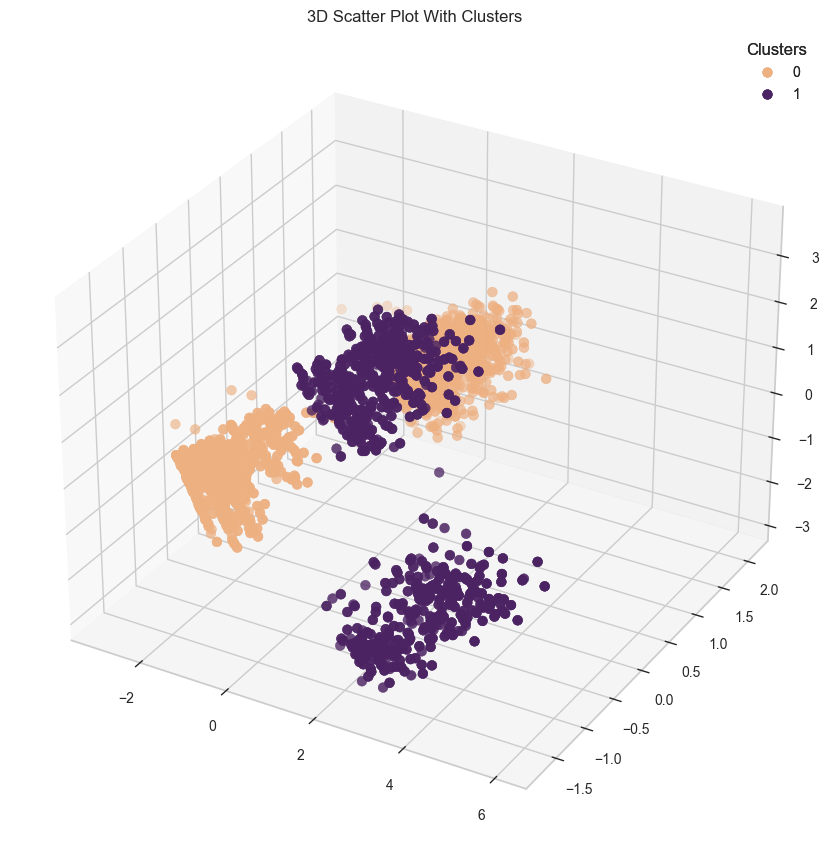

In [99]:
selected_columns = ['Tenure', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others', 'PreferedOrderCat_Fashion']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=5)
X_pca_selected = pca.fit_transform(df_selected)

agg = AgglomerativeClustering(n_clusters=2)
clusters = agg.fit_predict(df_selected)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='flare', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

##### Dendogrami:

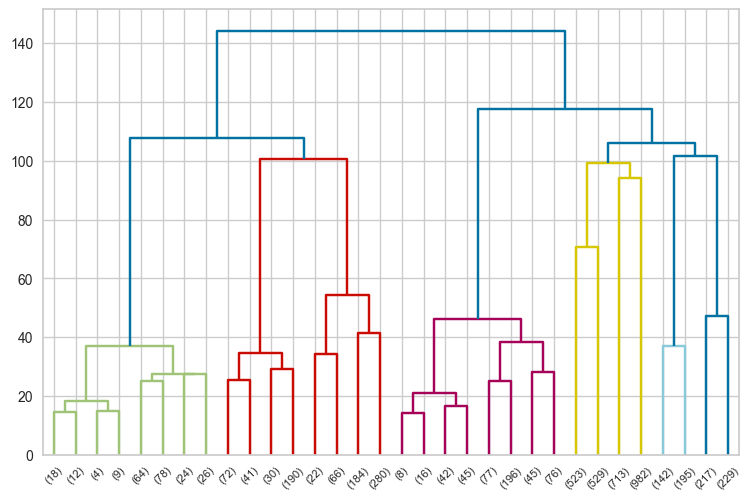

In [100]:
import scipy.cluster.hierarchy as sch

X = df.values
dendrogram = sch.dendrogram(sch.linkage(X, method='ward'), truncate_mode='level', p=4)

#### Agglomerative - 3 klastera

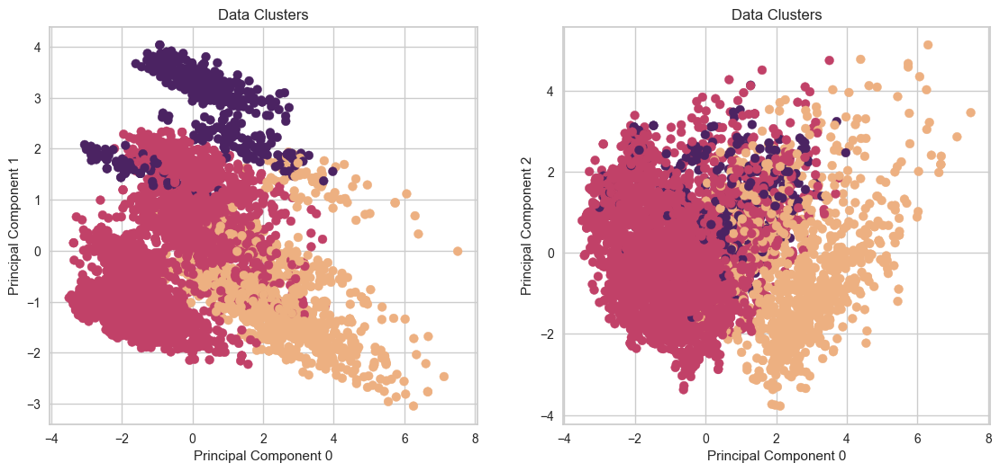

In [101]:
agglomerative = AgglomerativeClustering(n_clusters=3)
clusters = agglomerative.fit_predict(df)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='flare', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')

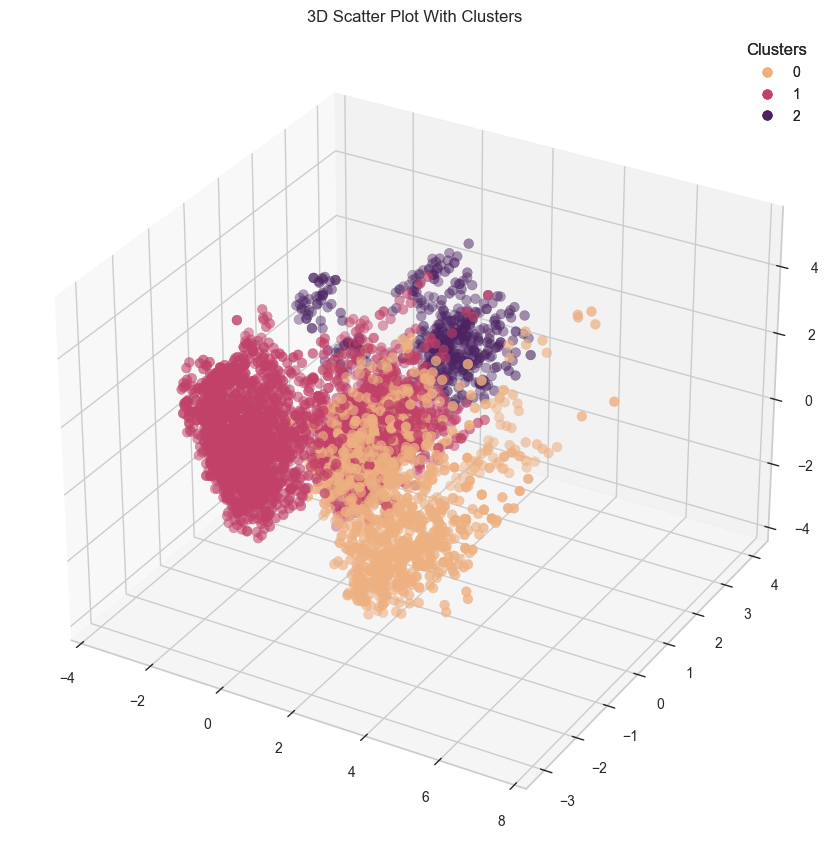

In [102]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='flare', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

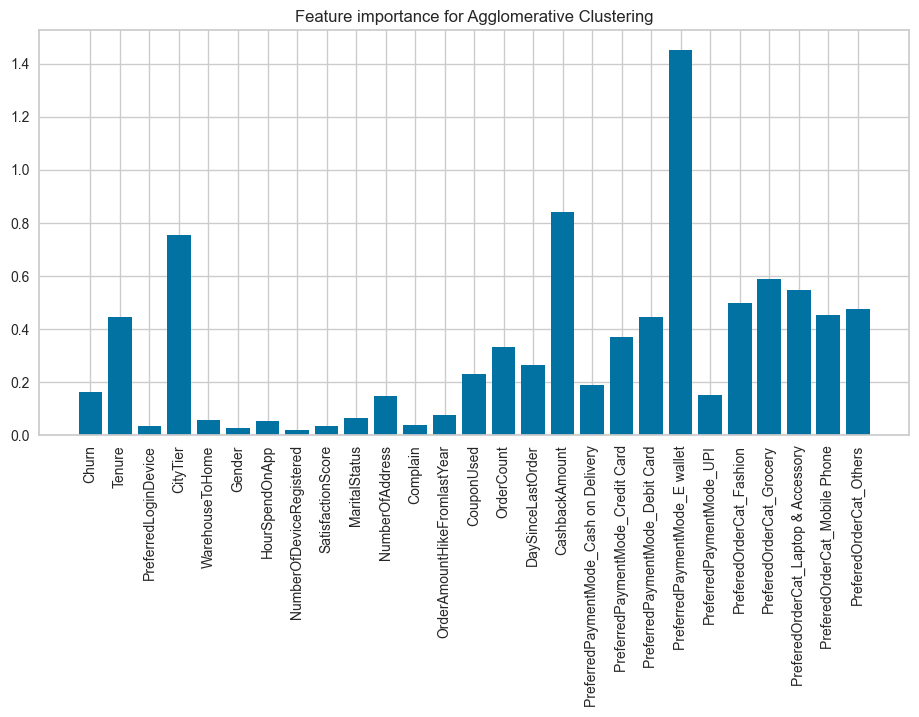

In [103]:
cent = np.array([df.loc[agglomerative.labels_ == label].mean(axis=0) for label in np.unique(agglomerative.labels_)])

feature_importance = cent.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for Agglomerative Clustering')
plt.show()

In [104]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'CityTier', 'OrderCount', 'CashbackAmount',
       'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card',
       'PreferredPaymentMode_E wallet', 'PreferedOrderCat_Fashion',
       'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others'],
      dtype='object')


In [106]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(3)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(3), index=important_columns)

In [107]:
cluster_data

,0,1,2
Tenure,0.758174,-0.220274,-0.141755
CityTier,-0.083456,-0.182672,1.461987
OrderCount,0.567475,-0.165576,-0.101167
CashbackAmount,1.480037,-0.456901,-0.088675
PreferredPaymentMode_Credit Card,0.154669,0.048077,-0.679093
PreferredPaymentMode_Debit Card,0.163080,0.066868,-0.829095
PreferredPaymentMode_E wallet,-0.155787,-0.354325,2.822272
PreferedOrderCat_Fashion,0.904413,-0.314849,0.194999
PreferedOrderCat_Grocery,0.973661,-0.269842,-0.273185
PreferedOrderCat_Laptop & Accessory,-0.757658,0.161627,0.550559


Klaster 0 - dugačko ukupno iskustvo sa kompanijom, veći broj porudžbina, značajno veći povraćaj novca, preferiraju plaćanje putem elektronskog novčanika, plaćanje karticom, korisnici koji pripadaju ovom klasteru preferiraju kategorije Fashion i Accessory, kao i Grocery i Others <br> 
Klaster 1 - kraće ukupno iskustvo sa kompanijom, manji broj porudžbina, osobe koje generalno dobijaju manji povrata novca, plaćanje karticom, preferiraju kategorije Mobile Phone i Laptop <br>
Klaster 2 - kraće ukupno iskustvo sa kompanijom, manji broj porudžbina, srednji povraćaj novca, plaćanje E-novčanikom, osobe koje preferiraju kategoriju Laptop & Accessory

##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

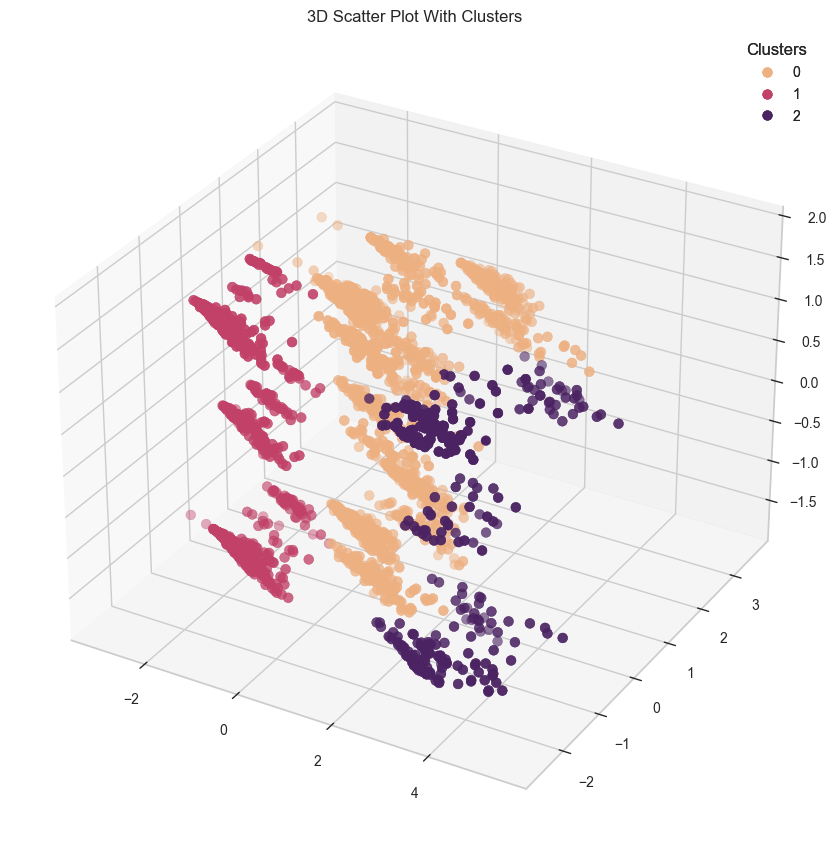

In [108]:
selected_columns = ['Tenure', 'CityTier', 'OrderCount', 'CashbackAmount',
       'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card',
       'PreferredPaymentMode_E wallet', 'PreferedOrderCat_Fashion',
       'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=5)
X_pca_selected = pca.fit_transform(df_selected)

agg = AgglomerativeClustering(n_clusters=3)
clusters = agg.fit_predict(df_selected)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='flare', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

##### Dendogrami

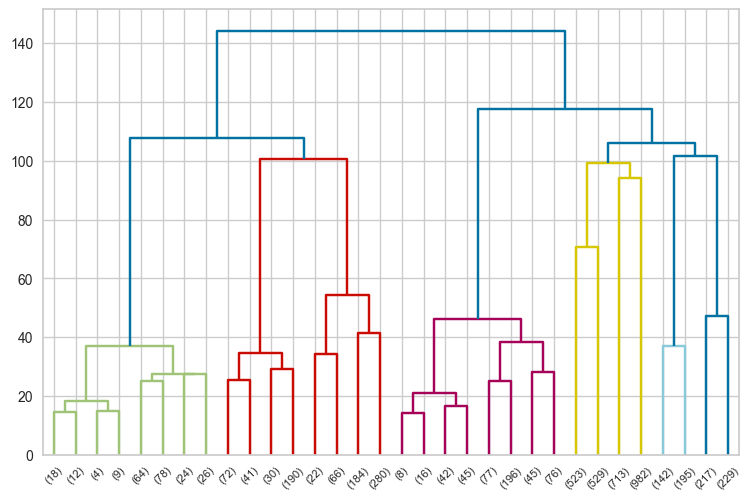

In [109]:
import scipy.cluster.hierarchy as sch

X = df.values
dendrogram = sch.dendrogram(sch.linkage(X, method='ward'), truncate_mode='level', p=4)

##### Visina sečenja 117:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


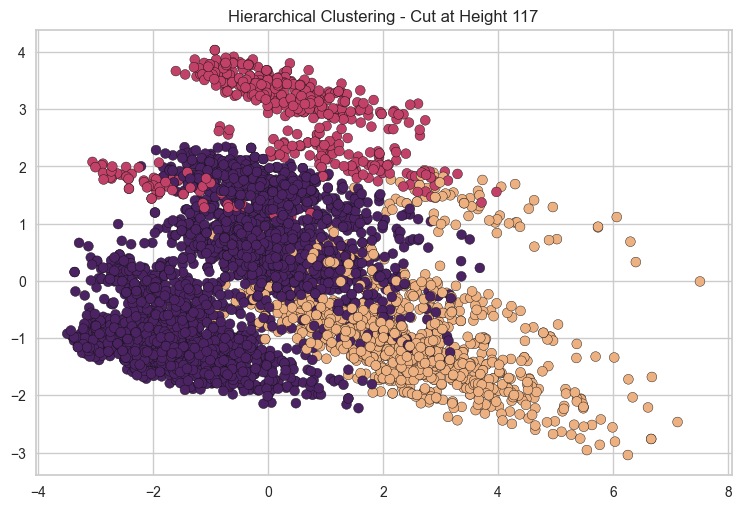

In [110]:
from scipy import cluster
from scipy.cluster.hierarchy import linkage

linkage_matrix = linkage(X, method='ward')
cut_height = 117
cluster_assignments = sch.fcluster(linkage_matrix, cut_height, criterion='distance')

plt.scatter(X_pca[:, 0], X_pca[:, 1], c=cluster_assignments, cmap='flare', s=50, edgecolors='k', marker='o')
plt.title(f'Hierarchical Clustering - Cut at Height {cut_height}')
plt.legend()
plt.show()

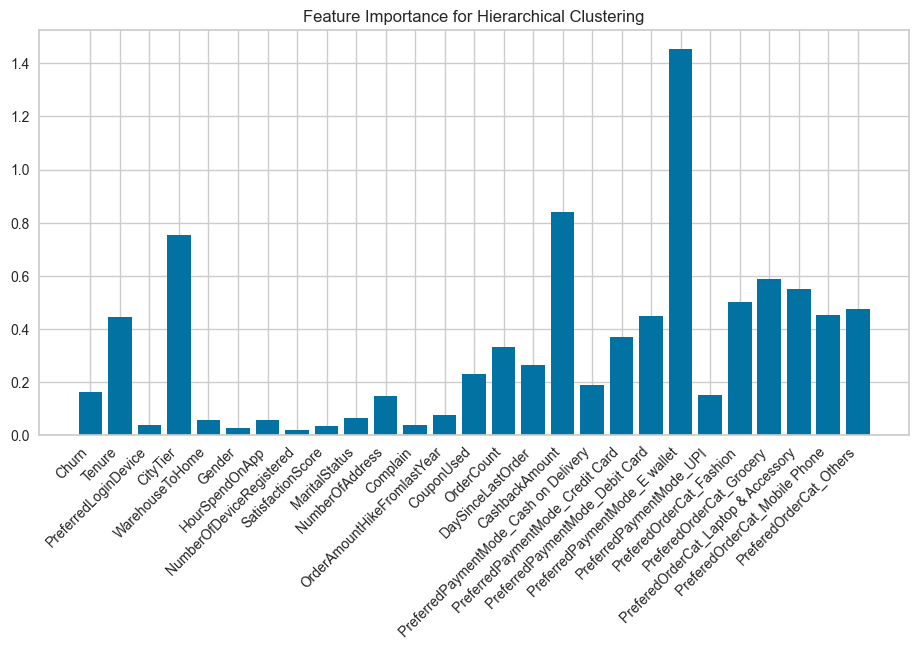

In [111]:
centroids = np.array([X[cluster_assignments == label].mean(axis=0) for label in np.unique(cluster_assignments)])
feature_importance = centroids.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=45, ha='right')
plt.title('Feature Importance for Hierarchical Clustering')
plt.show()

In [112]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'CityTier', 'OrderCount', 'CashbackAmount',
       'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card',
       'PreferredPaymentMode_E wallet', 'PreferedOrderCat_Fashion',
       'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others'],
      dtype='object')


In [115]:
cluster_data = np.array([df[cluster_assignments == i][important_columns].mean(axis=0) for i in range(1,4)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(1,4), index=important_columns)

In [116]:
cluster_data

,1,2,3
Tenure,0.758174,-0.141755,-0.220274
CityTier,-0.083456,1.461987,-0.182672
OrderCount,0.567475,-0.101167,-0.165576
CashbackAmount,1.480037,-0.088675,-0.456901
PreferredPaymentMode_Credit Card,0.154669,-0.679093,0.048077
PreferredPaymentMode_Debit Card,0.163080,-0.829095,0.066868
PreferredPaymentMode_E wallet,-0.155787,2.822272,-0.354325
PreferedOrderCat_Fashion,0.904413,0.194999,-0.314849
PreferedOrderCat_Grocery,0.973661,-0.273185,-0.269842
PreferedOrderCat_Laptop & Accessory,-0.757658,0.550559,0.161627


##### Visina sečenja 105:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


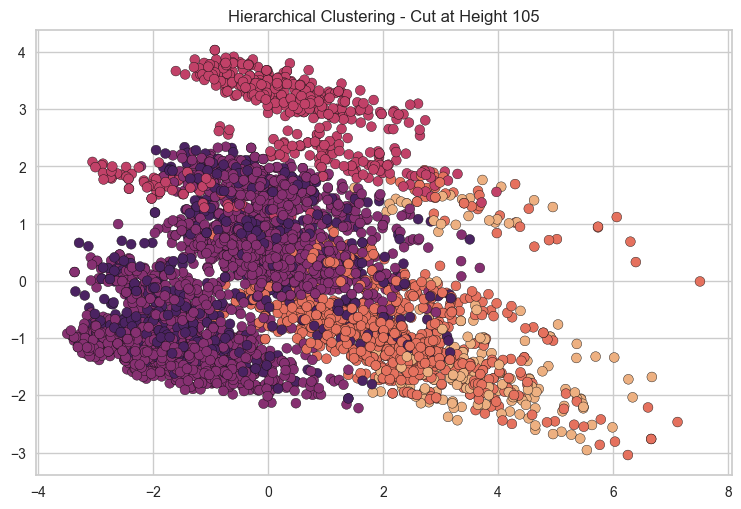

In [117]:
linkage_matrix = linkage(X, method='ward')
cut_height = 105
cluster_assignments = sch.fcluster(linkage_matrix, cut_height, criterion='distance')

plt.scatter(X_pca[:, 0], X_pca[:, 1], c=cluster_assignments, cmap='flare', s=50, edgecolors='k', marker='o')
plt.title(f'Hierarchical Clustering - Cut at Height {cut_height}')
plt.legend()
plt.show()

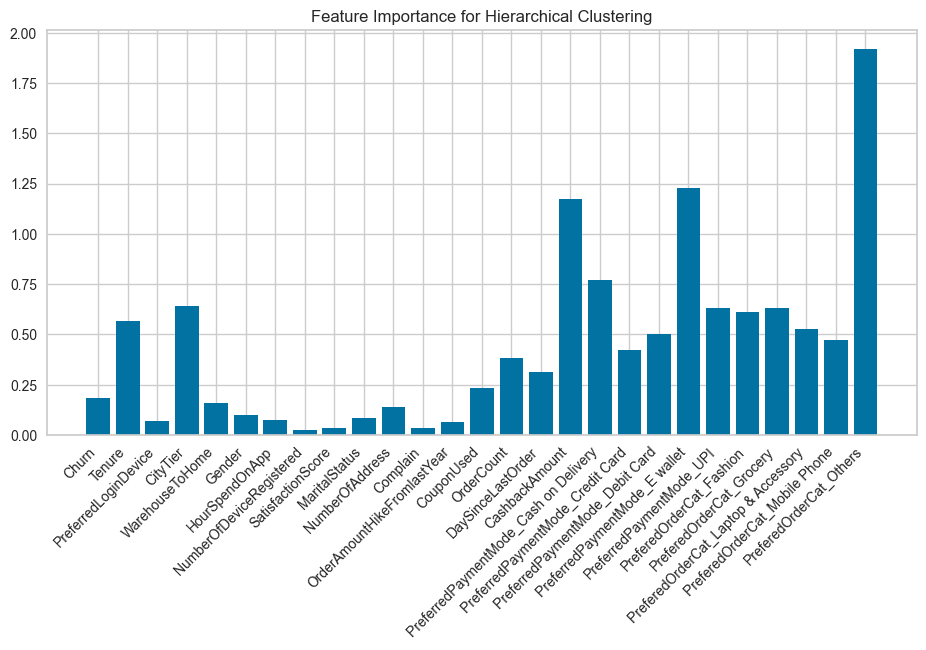

In [118]:
centroids = np.array([X[cluster_assignments == label].mean(axis=0) for label in np.unique(cluster_assignments)])
feature_importance = centroids.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=45, ha='right')
plt.title('Feature Importance for Hierarchical Clustering')
plt.show()

In [119]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'CityTier', 'OrderCount', 'DaySinceLastOrder',
       'CashbackAmount', 'PreferredPaymentMode_Cash on Delivery',
       'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card',
       'PreferredPaymentMode_E wallet', 'PreferredPaymentMode_UPI',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others'],
      dtype='object')


Primećuje se da je sečenjem dendograma na visini 105 veći uticaj kategorije Others.

In [120]:
cluster_data = np.array([df[cluster_assignments == i][important_columns].mean(axis=0) for i in range(1,6)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(1,6), index=important_columns)

In [121]:
cluster_data

,1,2,3,4,5
Tenure,1.192275,0.642904,-0.141755,-0.229096,-0.189326
CityTier,-0.180983,-0.057559,1.461987,-0.200027,-0.121786
OrderCount,0.754779,0.517739,-0.101167,-0.183895,-0.101306
DaySinceLastOrder,0.655772,0.413399,-0.036607,-0.175197,-0.025812
CashbackAmount,2.610031,1.179982,-0.088675,-0.496290,-0.318714
PreferredPaymentMode_Cash on Delivery,-0.200402,-0.240005,-0.318214,-0.318214,1.653043
PreferredPaymentMode_Credit Card,0.108317,0.166977,-0.679093,0.255349,-0.679093
PreferredPaymentMode_Debit Card,-0.049645,0.219566,-0.829095,0.322251,-0.829095
PreferredPaymentMode_E wallet,-0.002871,-0.196392,2.822272,-0.354325,-0.354325
PreferredPaymentMode_UPI,0.125914,-0.208100,-0.281700,-0.281700,1.367392


##### Visina sečenja 80:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


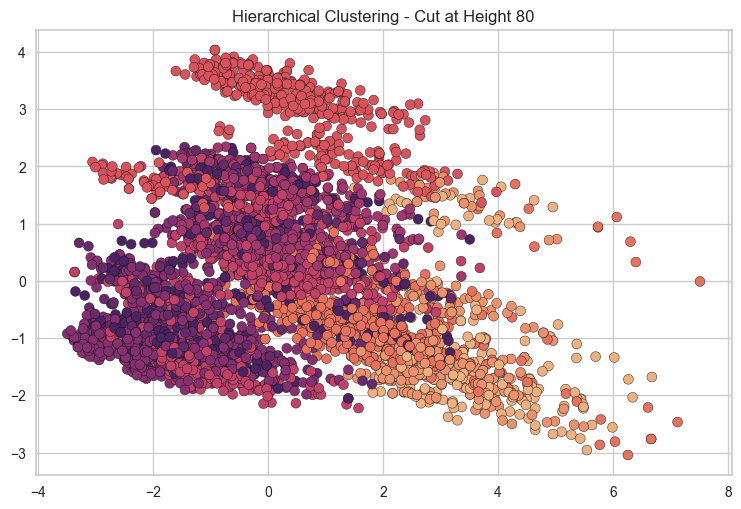

In [122]:
linkage_matrix = linkage(X, method='ward')
cut_height = 80
cluster_assignments = sch.fcluster(linkage_matrix, cut_height, criterion='distance')

plt.scatter(X_pca[:, 0], X_pca[:, 1], c=cluster_assignments, cmap='flare', s=50, edgecolors='k', marker='o')
plt.title(f'Hierarchical Clustering - Cut at Height {cut_height}')
plt.legend()
plt.show()

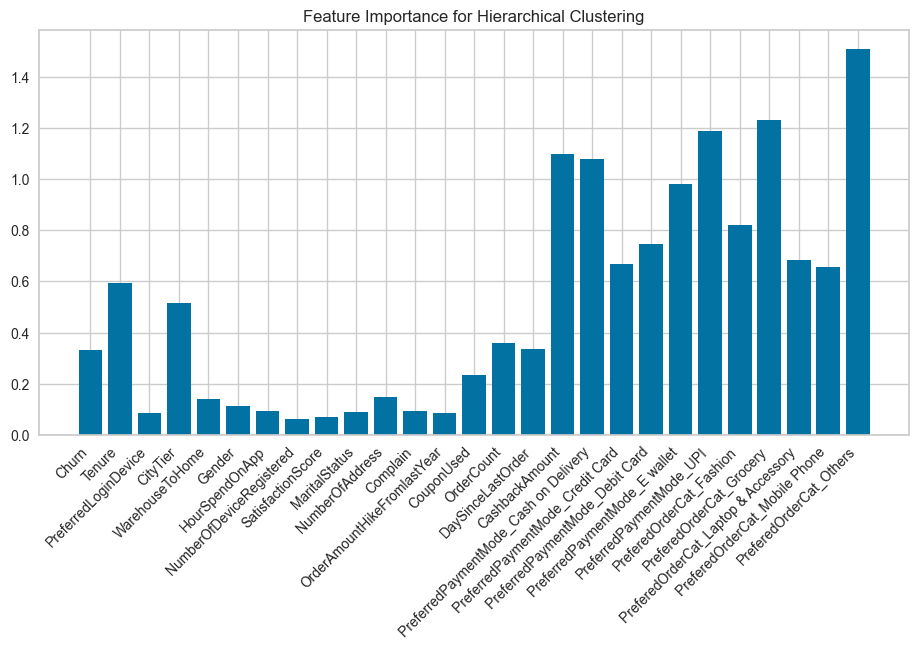

In [123]:
centroids = np.array([X[cluster_assignments == label].mean(axis=0) for label in np.unique(cluster_assignments)])
feature_importance = centroids.std(axis=0)

feature_names = [f'Feature {i+1}' for i in range(X.shape[1])]

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=45, ha='right')
plt.title('Feature Importance for Hierarchical Clustering')
plt.show()

Primećuje se da sečenjem dendograma na visini 80 značajno veći uticaj imaju fičeri koji se odnose na kategorije za poručivanje.

In [124]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Churn', 'Tenure', 'CityTier', 'OrderCount', 'DaySinceLastOrder',
       'CashbackAmount', 'PreferredPaymentMode_Cash on Delivery',
       'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card',
       'PreferredPaymentMode_E wallet', 'PreferredPaymentMode_UPI',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others'],
      dtype='object')


In [125]:
cluster_data = np.array([df[cluster_assignments == i][important_columns].mean(axis=0) for i in range(1,10)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(1,10), index=important_columns)

In [126]:
cluster_data

,1,2,3,4,5,6,7,8,9
Churn,-0.266044,-0.416236,-0.045663,0.193372,-0.305828,-0.410843,0.626267,0.068216,0.236232
Tenure,1.192275,1.249624,0.276894,-0.141755,-0.191763,0.039788,-0.464318,-0.307980,-0.099670
CityTier,-0.180983,-0.080675,-0.043614,1.461987,-0.234153,0.106678,-0.386158,-0.101202,-0.137339
OrderCount,0.754779,0.499624,0.528667,-0.101167,-0.130791,-0.105086,-0.298006,-0.172128,-0.047792
DaySinceLastOrder,0.655772,0.447979,0.392538,-0.036607,-0.086712,0.182442,-0.529661,-0.071524,0.008728
CashbackAmount,2.610031,1.874408,0.761062,-0.088675,-0.490616,-0.170000,-0.739277,-0.362201,-0.285854
PreferredPaymentMode_Cash on Delivery,-0.200402,-0.110362,-0.318214,-0.318214,-0.318214,-0.318214,-0.318214,-0.318214,3.142535
PreferredPaymentMode_Credit Card,0.108317,0.083351,0.217425,-0.679093,1.456189,-0.679093,-0.352622,-0.679093,-0.679093
PreferredPaymentMode_Debit Card,-0.049645,0.063228,0.313879,-0.829095,-0.813617,1.206135,0.897327,-0.829095,-0.829095
PreferredPaymentMode_E wallet,-0.002871,-0.049066,-0.285268,2.822272,-0.354325,-0.354325,-0.354325,-0.354325,-0.354325


### DBSCAN

5155


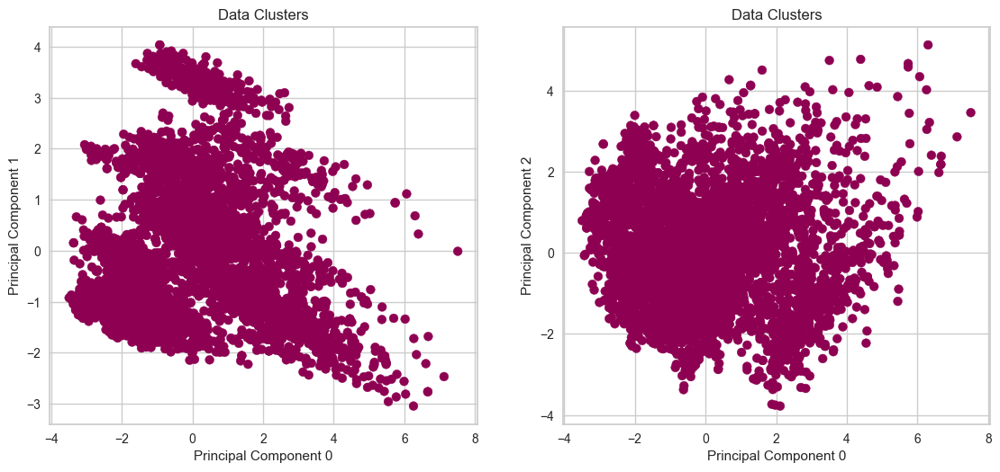

In [127]:
from sklearn.cluster import DBSCAN

def cosine_distance(x, y):
    return 1 - np.dot(x, y) / (np.linalg.norm(x) * np.linalg.norm(y))

dbscan = DBSCAN(metric=cosine_distance, eps=0.5, min_samples=10)
y_dbscan = dbscan.fit_predict(df)

print((y_dbscan != -1).sum())

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=y_dbscan, cmap='PiYG', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')

In [260]:
num_clusters = len(set(y_dbscan)) - (1 if -1 in y_dbscan else 0)

#print(f"Number of clusters predicted by DBSCAN: {num_clusters}")

### HDBSCAN

5114


<Figure size 2000x500 with 0 Axes>

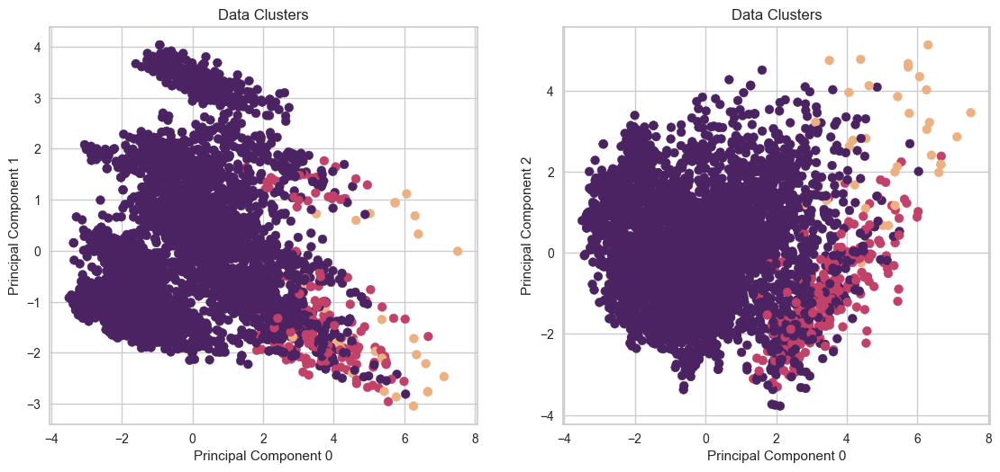

In [128]:
import hdbscan

hdbscan_clusterer = hdbscan.HDBSCAN(min_cluster_size=10)
y_hdbscan = hdbscan_clusterer.fit_predict(df)

print((y_hdbscan != -1).sum())

plt.figure(figsize=(20, 5))

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=y_hdbscan, cmap='flare', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')

In [129]:
num_clusters = len(set(y_hdbscan)) #- (1 if -1 in y_hdbscan else 0)

print(f"Number of clusters predicted by HDBSCAN: {num_clusters}")

Number of clusters predicted by HDBSCAN: 3


### Gaussian Mixture 

#### Odredjivanje optimalnog broja klastera za Gaussian Mixture

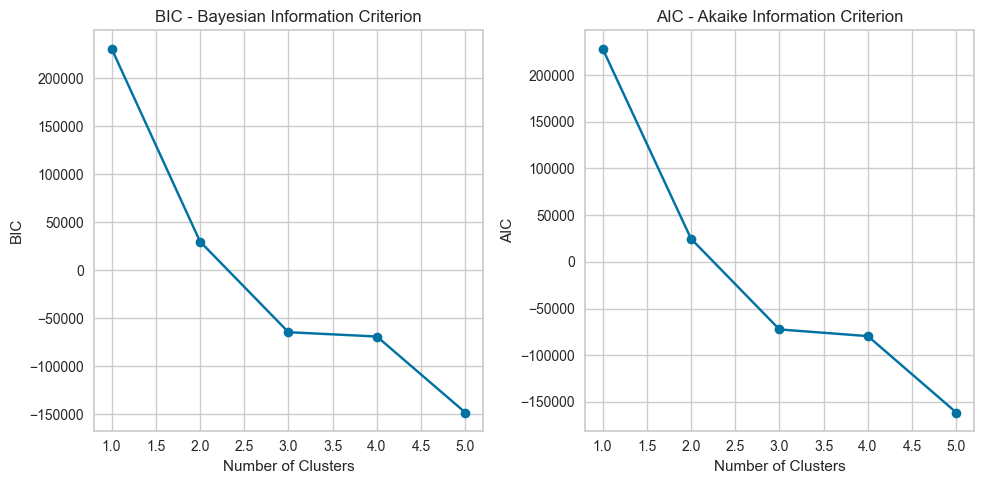

Optimal number of clusters based on BIC: 5
Optimal number of clusters based on AIC: 5


In [130]:
from sklearn.mixture import GaussianMixture

n_clusters_range = range(1, 6)
bics = []
aics = []

for n_clusters in n_clusters_range:
    gmm = GaussianMixture(n_components=n_clusters, random_state=42)
    gmm.fit(df)
    bics.append(gmm.bic(df))
    aics.append(gmm.aic(df))

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(n_clusters_range, bics, marker='o')
plt.title('BIC - Bayesian Information Criterion')
plt.xlabel('Number of Clusters')
plt.ylabel('BIC')

plt.subplot(1, 2, 2)
plt.plot(n_clusters_range, aics, marker='o')
plt.title('AIC - Akaike Information Criterion')
plt.xlabel('Number of Clusters')
plt.ylabel('AIC')

plt.tight_layout()
plt.show()

optimal_clusters_bic = n_clusters_range[np.argmin(bics)]
optimal_clusters_aic = n_clusters_range[np.argmin(aics)]

print(f'Optimal number of clusters based on BIC: {optimal_clusters_bic}')
print(f'Optimal number of clusters based on AIC: {optimal_clusters_aic}')

#### Gaussian Mixture - 5 klastera

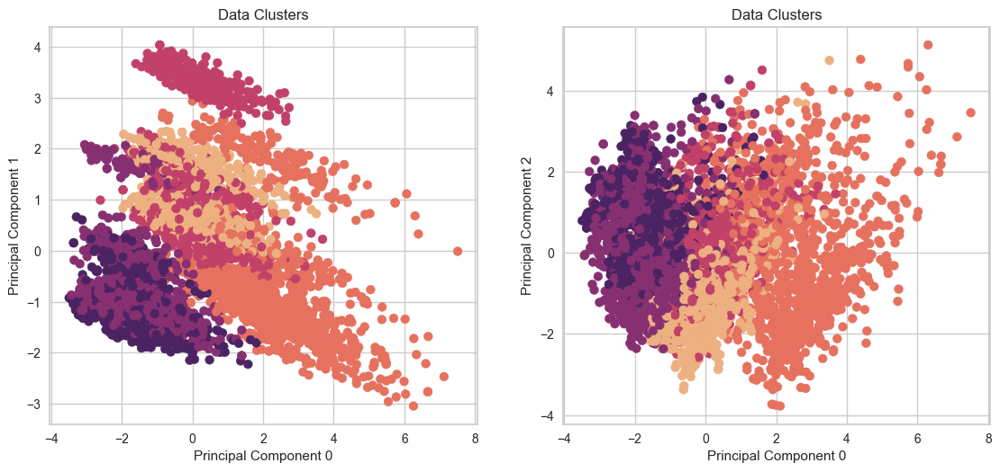

In [131]:
gmm = GaussianMixture(n_components=5, random_state=42)
clusters = gmm.fit_predict(df)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='flare', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')

plt.show()

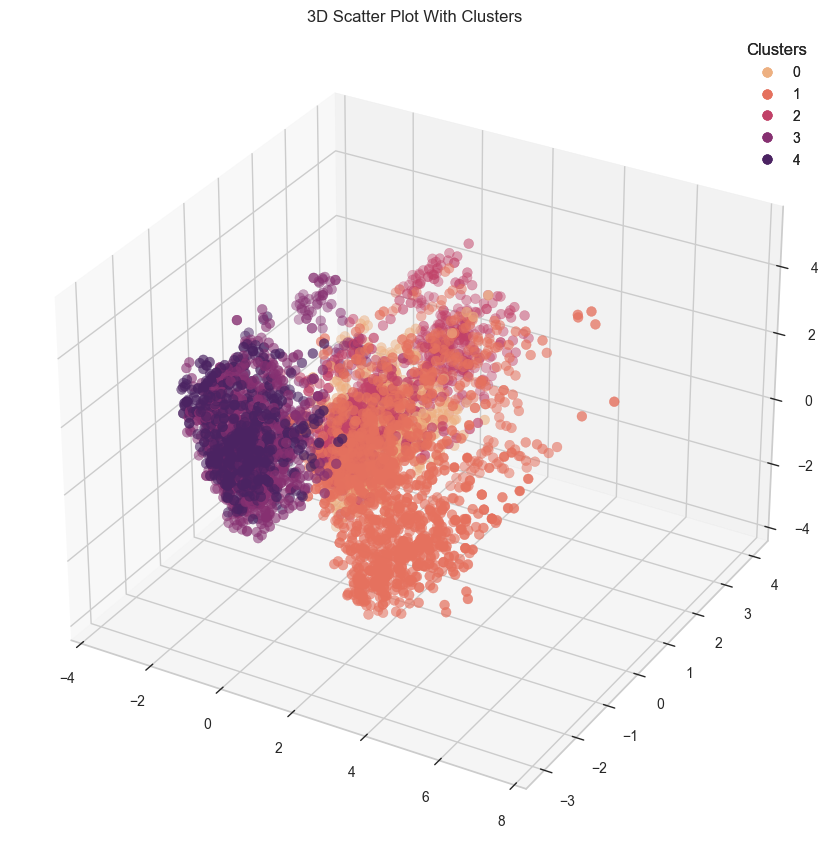

In [132]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='flare', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

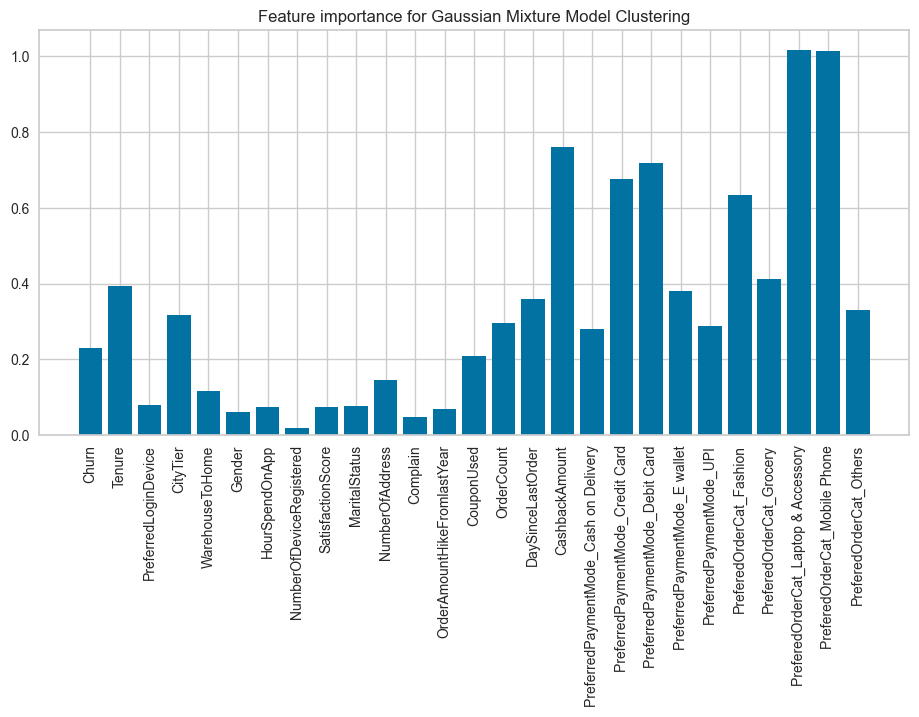

In [133]:
centroids = np.array([df.loc[clusters == label].mean(axis=0) for label in np.unique(clusters)])

feature_importance = centroids.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for Gaussian Mixture Model Clustering')
plt.show()

In [134]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'CityTier', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card',
       'PreferredPaymentMode_E wallet', 'PreferedOrderCat_Fashion',
       'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others'],
      dtype='object')


In [135]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(5)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(5), index=important_columns)

In [136]:
cluster_data

,0,1,2,3,4
Tenure,-0.020328,0.660524,-0.108833,-0.364271,-0.465083
CityTier,0.125034,0.036215,0.482495,-0.257378,-0.432757
DaySinceLastOrder,0.174967,0.461650,0.074641,-0.496816,-0.391791
CashbackAmount,-0.187432,1.323054,-0.207041,-0.767563,-0.734105
PreferredPaymentMode_Credit Card,-0.679093,0.005592,0.470205,-0.679093,1.069445
PreferredPaymentMode_Debit Card,0.886928,-0.011727,-0.829095,0.657035,-0.829095
PreferredPaymentMode_E wallet,-0.354325,0.066278,0.675398,-0.132021,-0.354325
PreferedOrderCat_Fashion,-0.420324,1.164730,-0.420324,-0.420324,-0.420324
PreferedOrderCat_Grocery,-0.273185,0.757004,-0.273185,-0.273185,-0.273185
PreferedOrderCat_Laptop & Accessory,1.319857,-0.757658,1.319857,-0.757658,-0.757658


##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

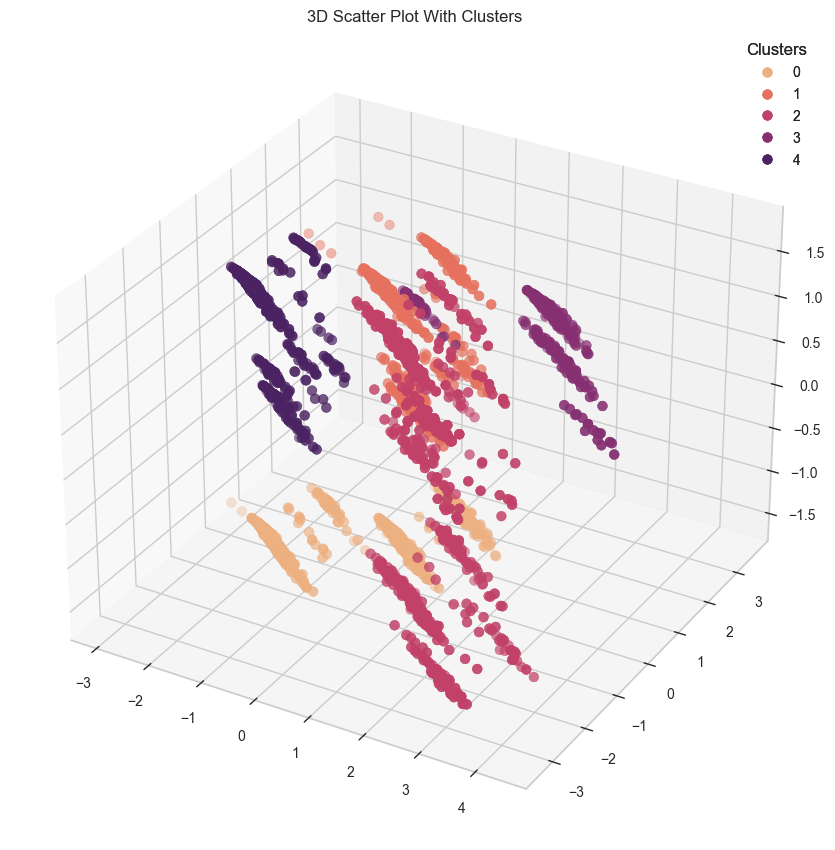

In [137]:
selected_columns = ['Tenure', 'CityTier', 'CashbackAmount',
       'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card',
       'PreferredPaymentMode_E wallet', 'PreferredPaymentMode_UPI',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=5)
X_pca_selected = pca.fit_transform(df_selected)

gmm = GaussianMixture(n_components=5)
clusters = gmm.fit_predict(df_selected)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='flare', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

### Birch

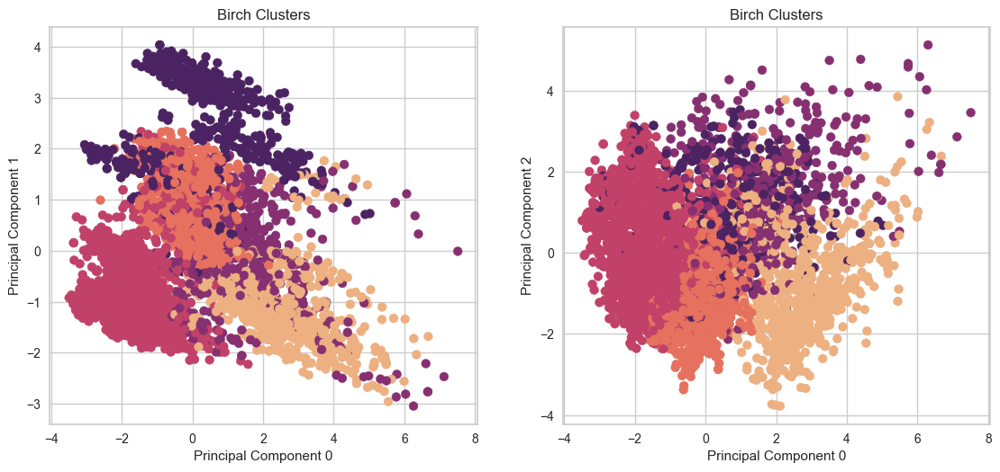

In [140]:
from sklearn.cluster import Birch
import matplotlib.pyplot as plt


birch = Birch(n_clusters=5)
clusters = birch.fit_predict(X_pca)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='flare', s=50)
    plt.title('Birch Clusters')
    plt.xlabel(f'Principal Component 0')
    plt.ylabel(f'Principal Component {y}')

plt.show()


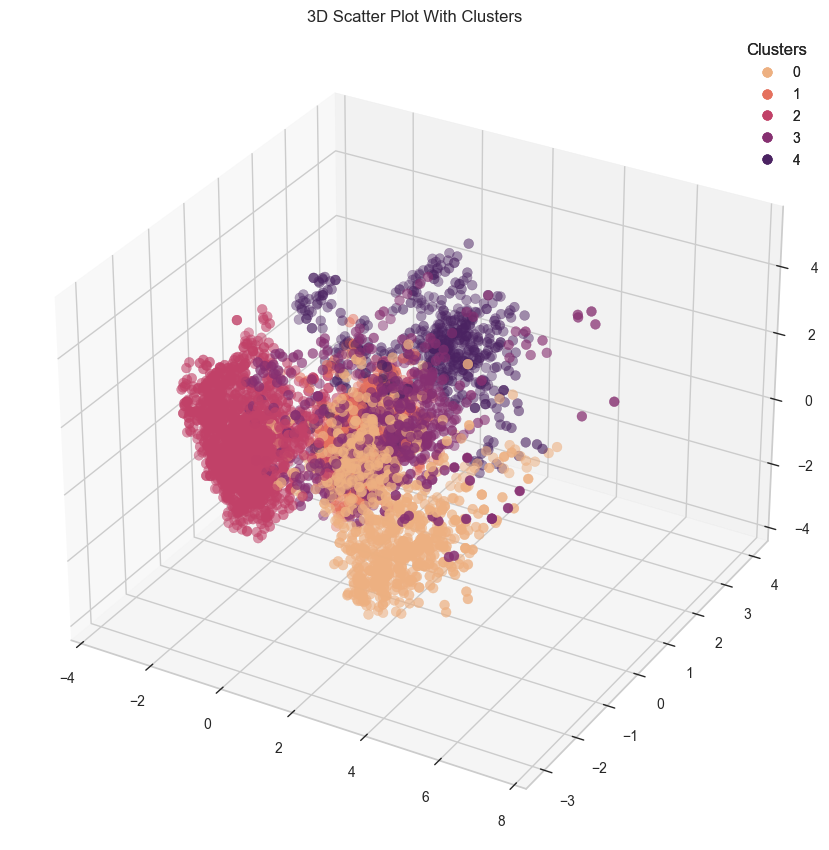

In [141]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='flare', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

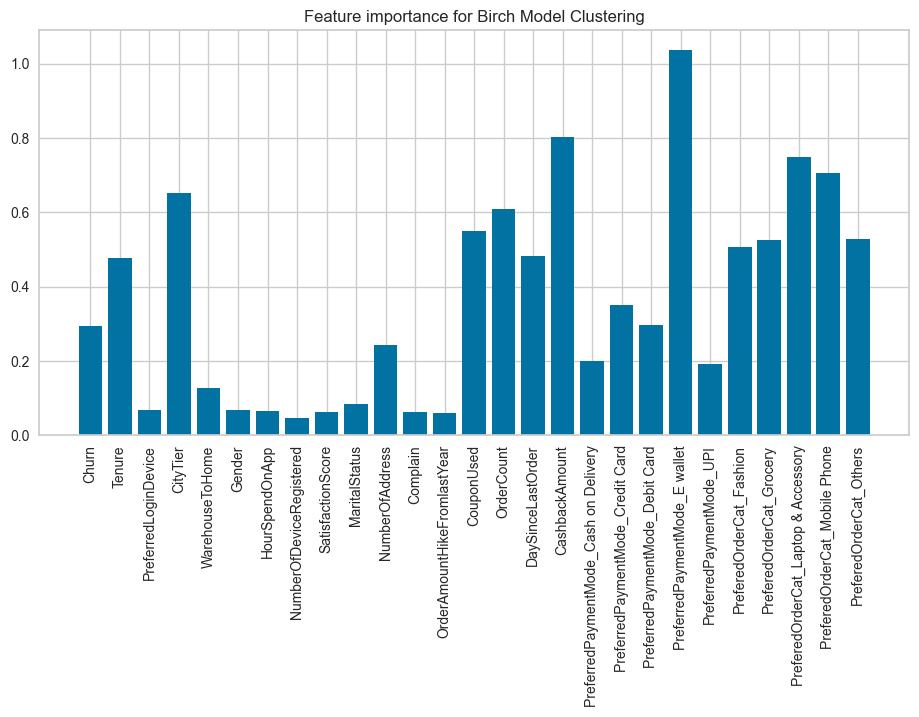

In [143]:
centroids = np.array([df.loc[clusters == label].mean(axis=0) for label in np.unique(clusters)])

feature_importance = centroids.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for Birch Model Clustering')
plt.show()

In [144]:
important_columns = df.columns[feature_importance > 0.2]
print(important_columns)

Index(['Churn', 'Tenure', 'CityTier', 'NumberOfAddress', 'CouponUsed',
       'OrderCount', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card',
       'PreferredPaymentMode_E wallet', 'PreferedOrderCat_Fashion',
       'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others'],
      dtype='object')


In [145]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(5)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(5), index=important_columns)

In [146]:
cluster_data

,0,1,2,3,4
Churn,-0.302252,-0.363695,0.219114,-0.042339,0.399854
Tenure,1.001491,0.007543,-0.406049,0.016178,-0.137146
CityTier,-0.283347,0.065927,-0.377879,-0.030930,1.421150
NumberOfAddress,0.395730,0.133826,-0.151688,-0.308949,0.037754
CouponUsed,0.198964,-0.312148,-0.291740,1.164087,-0.114676
OrderCount,0.390212,-0.352956,-0.384497,1.242049,-0.104801
DaySinceLastOrder,0.391799,-0.027048,-0.479350,0.948000,-0.056129
CashbackAmount,1.687289,-0.204941,-0.708290,0.167091,0.056376
PreferredPaymentMode_Credit Card,0.306120,0.177562,0.073419,-0.224300,-0.679093
PreferredPaymentMode_Debit Card,-0.058942,0.299275,-0.020330,0.185553,-0.562387


##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

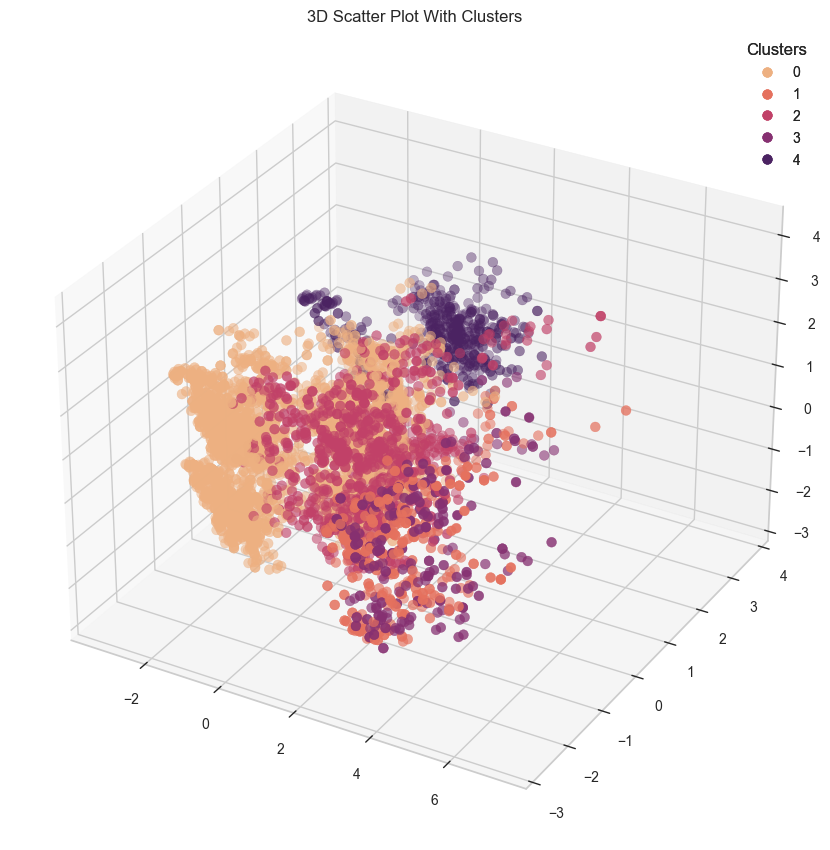

In [169]:
selected_columns = ['Churn', 'Tenure', 'CityTier', 'NumberOfAddress', 'CouponUsed',
       'OrderCount', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card',
       'PreferredPaymentMode_E wallet', 'PreferedOrderCat_Fashion',
       'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=7)
X_pca_selected = pca.fit_transform(df_selected)

birch = Birch(n_clusters=5)
clusters = birch.fit_predict(df_selected)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='flare', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

### Fuzzy KMeans

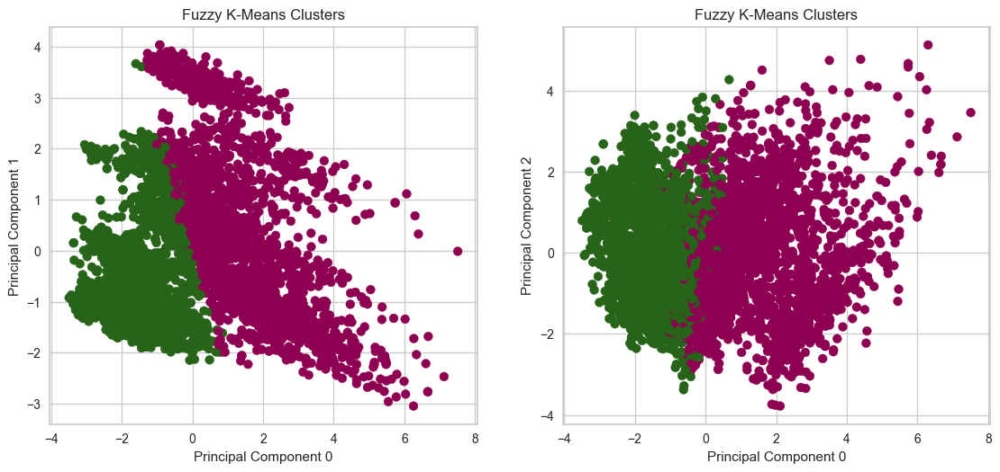

In [156]:
import numpy as np
import skfuzzy as fuzz
import matplotlib.pyplot as plt


cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    X_pca.T, c=2, m=2, error=0.005, maxiter=1000, init=None
)

clusters = np.argmax(u, axis=0)

plt.figure(figsize=(12, 12))
for i, y in enumerate((1, 2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='PiYG', s=50)
    plt.title('Fuzzy K-Means Clusters')
    plt.xlabel('Principal Component 0')
    plt.ylabel(f'Principal Component {y}')

plt.show()

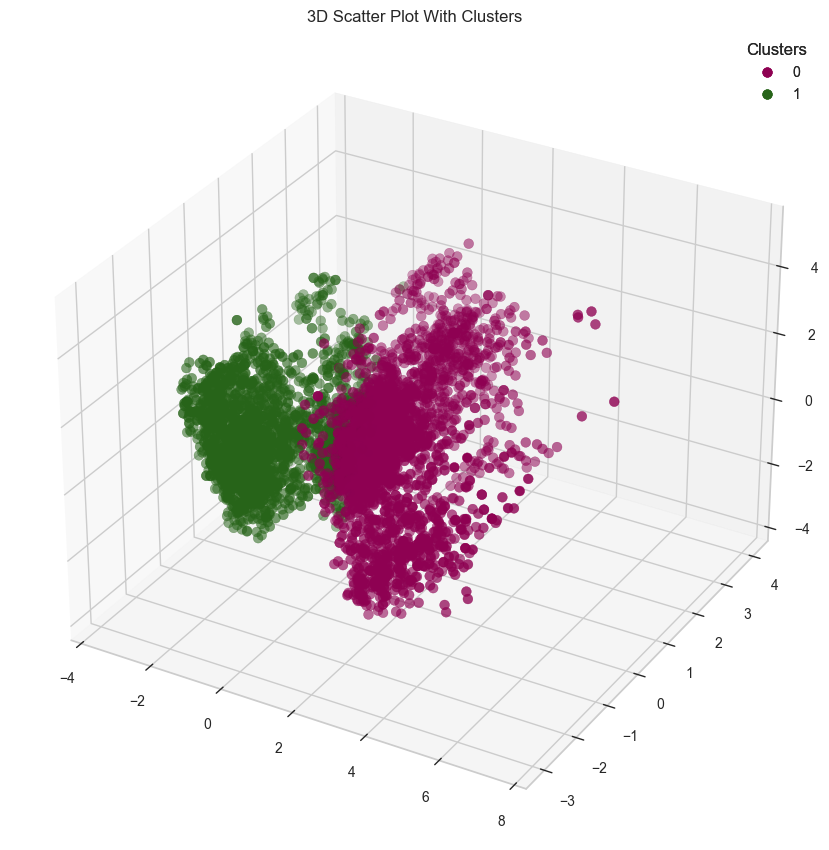

In [157]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='PiYG', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

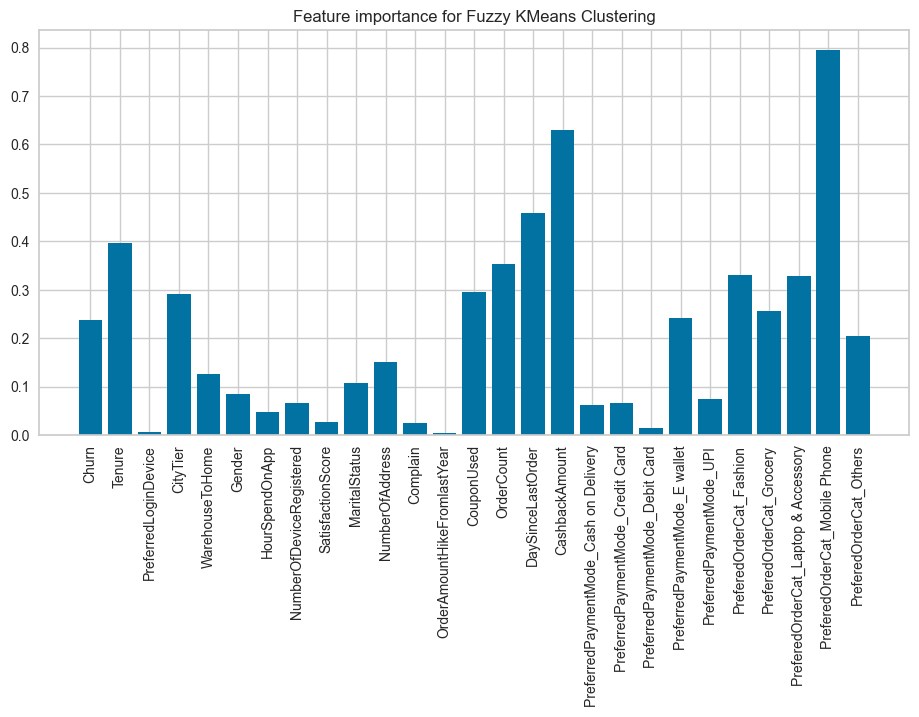

In [158]:
centroids = np.array([df.loc[clusters == label].mean(axis=0) for label in np.unique(clusters)])

feature_importance = centroids.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for Fuzzy KMeans Clustering')
plt.show()

In [162]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone'],
      dtype='object')


In [163]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(2)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(2), index=important_columns)

In [164]:
cluster_data

,0,1
Tenure,0.371800,-0.422163
OrderCount,0.331799,-0.376744
DaySinceLastOrder,0.429557,-0.487745
CashbackAmount,0.589119,-0.668921
PreferedOrderCat_Fashion,0.308900,-0.350743
PreferedOrderCat_Laptop & Accessory,0.308006,-0.349729
PreferedOrderCat_Mobile Phone,-0.745407,0.846379


##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

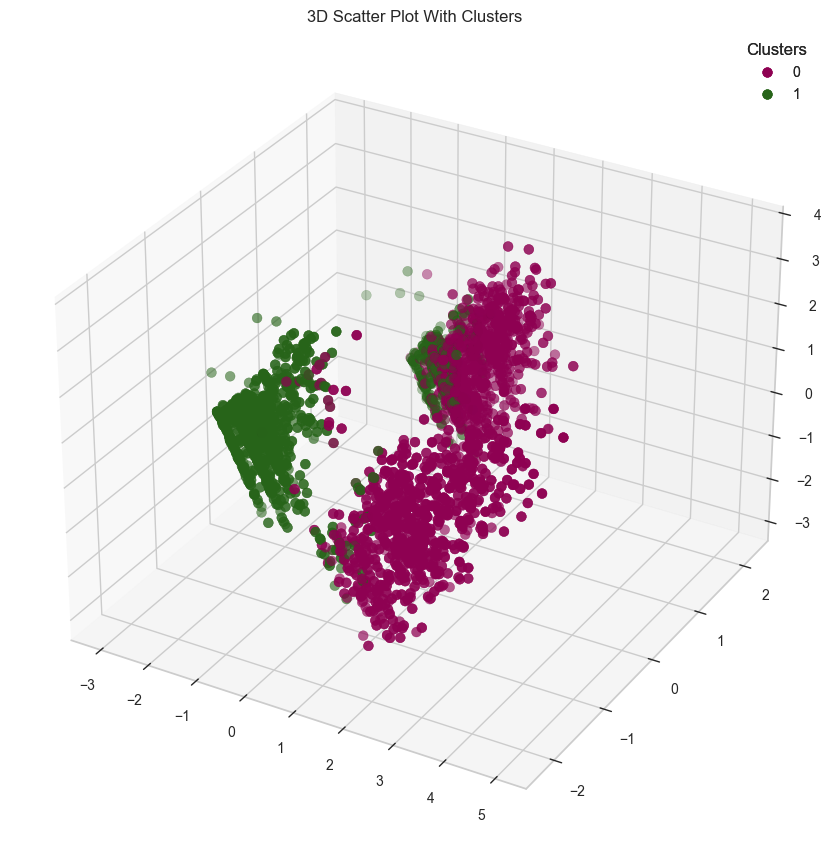

In [170]:
selected_columns = ['Tenure', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=7)
X_pca_selected = pca.fit_transform(df_selected)

cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    X_pca.T, c=2, m=2, error=0.005, maxiter=1000, init=None
)

clusters = np.argmax(u, axis=0)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='PiYG', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

### Bisecting KMeans

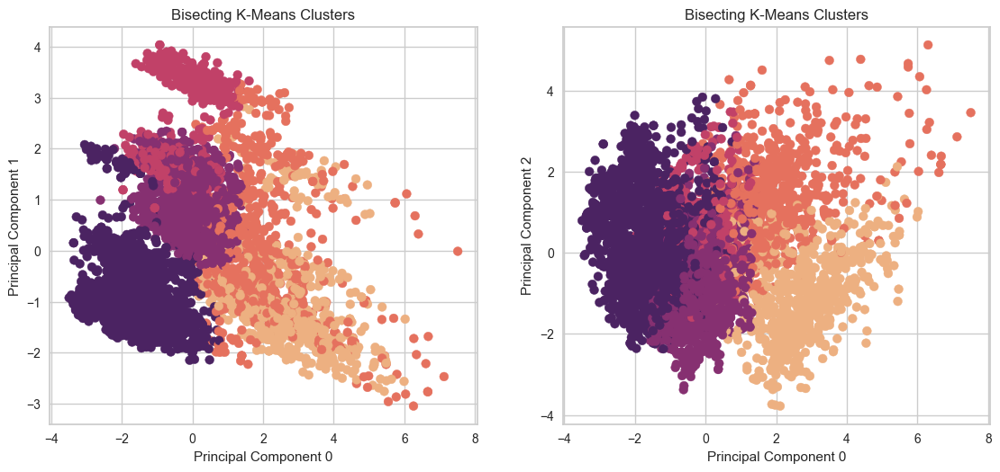

In [172]:
from sklearn.cluster import BisectingKMeans
import matplotlib.pyplot as plt

bkm = BisectingKMeans(n_clusters=5)
clusters = bkm.fit_predict(X_pca)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1, 2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='flare', s=50)
    plt.title('Bisecting K-Means Clusters')
    plt.xlabel('Principal Component 0')
    plt.ylabel(f'Principal Component {y}')

plt.show()


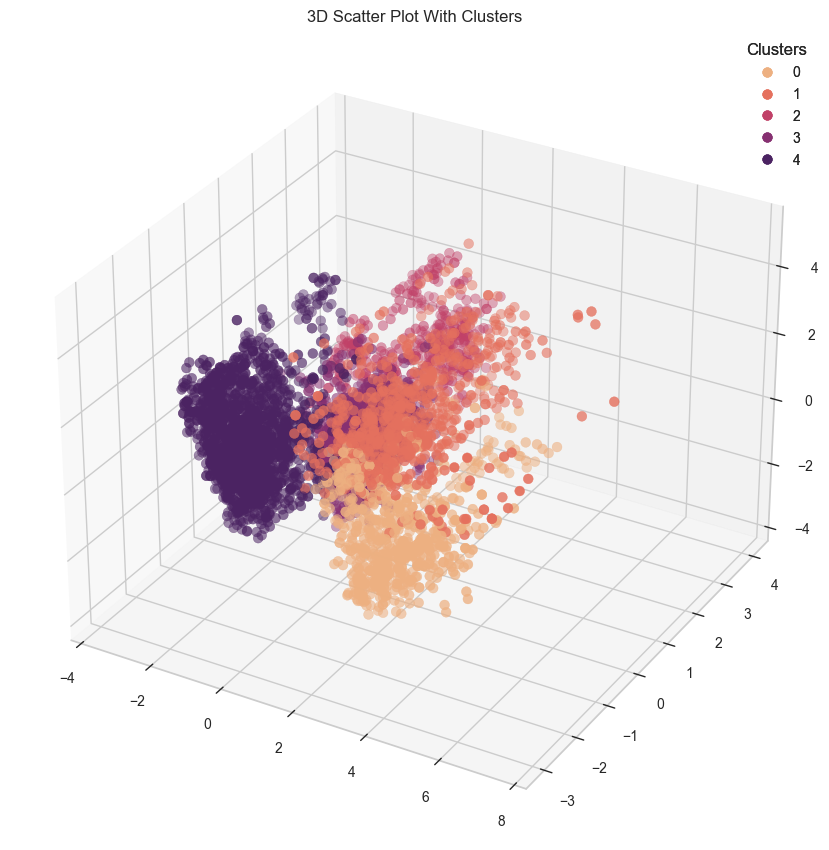

In [173]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='flare', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

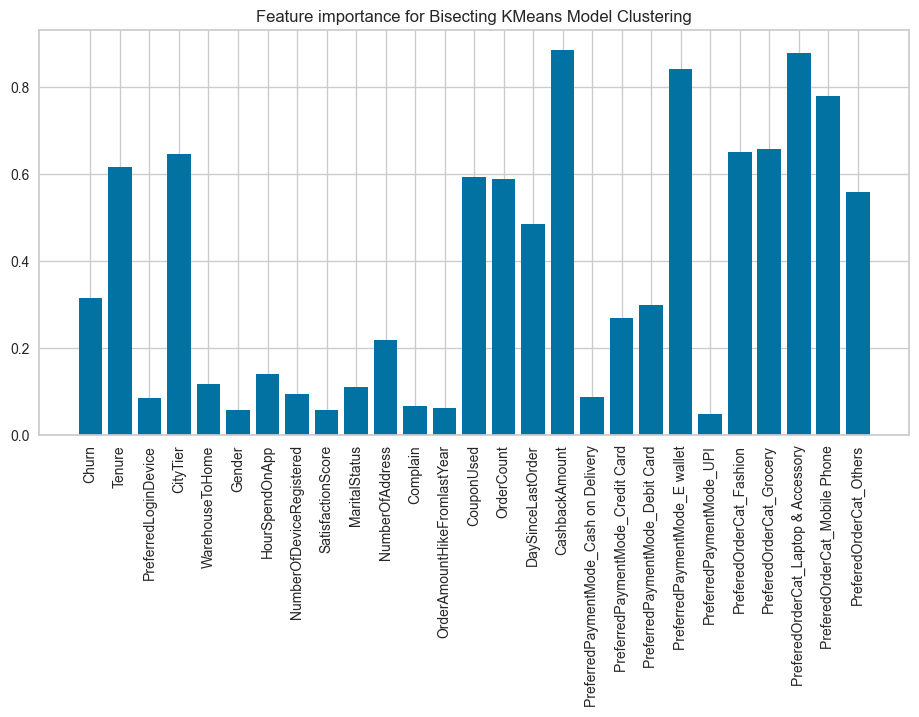

In [174]:
centroids = np.array([df.loc[clusters == label].mean(axis=0) for label in np.unique(clusters)])

feature_importance = centroids.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for Bisecting KMeans Model Clustering')
plt.show()

In [175]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Churn', 'Tenure', 'CityTier', 'CouponUsed', 'OrderCount',
       'DaySinceLastOrder', 'CashbackAmount', 'PreferredPaymentMode_E wallet',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others'],
      dtype='object')


In [176]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(5)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(5), index=important_columns)

In [177]:
cluster_data

,0,1,2,3,4
Churn,-0.404320,-0.030793,0.340069,-0.347683,0.320072
Tenure,1.267951,0.187448,-0.363924,-0.042728,-0.438179
CityTier,-0.212172,0.303881,1.438379,-0.026282,-0.366041
CouponUsed,0.023894,1.260357,-0.298275,-0.242663,-0.261414
OrderCount,0.284463,1.213099,-0.286838,-0.258535,-0.334131
DaySinceLastOrder,0.327525,0.936034,-0.207806,0.059764,-0.478373
CashbackAmount,1.819940,0.576687,-0.192740,-0.220860,-0.719335
PreferredPaymentMode_E wallet,-0.119021,0.264770,1.914673,-0.354325,-0.278099
PreferedOrderCat_Fashion,0.324658,1.348141,-0.220363,-0.385948,-0.331244
PreferedOrderCat_Grocery,1.415774,-0.035259,-0.273185,-0.273185,-0.273185


##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

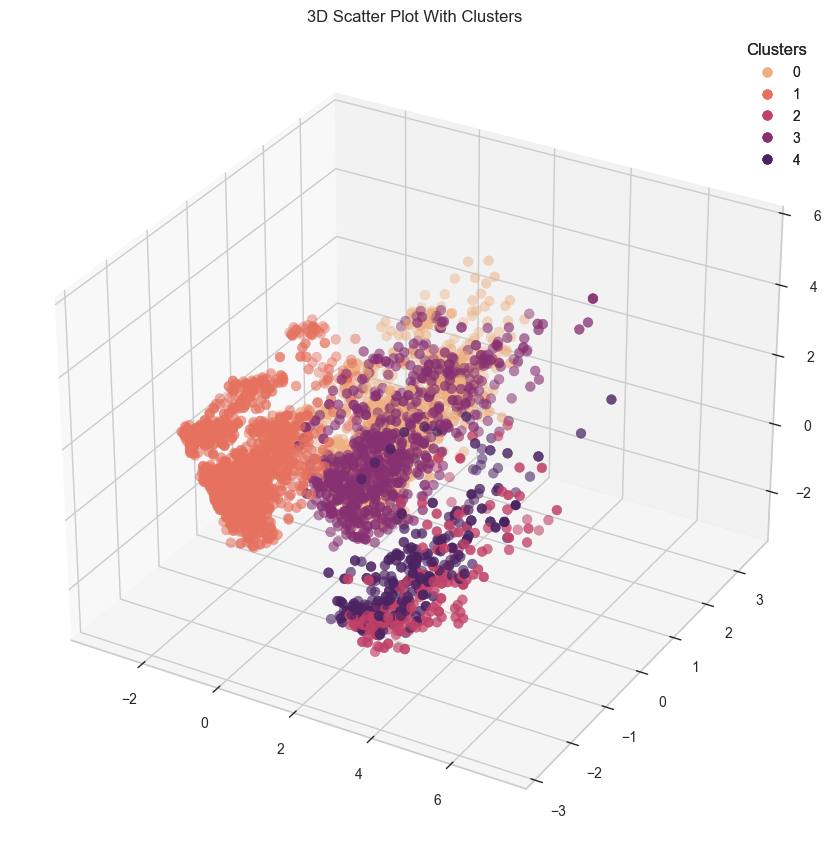

In [180]:
selected_columns = ['Churn', 'Tenure', 'CityTier', 'CouponUsed', 'OrderCount',
       'DaySinceLastOrder', 'CashbackAmount', 'PreferredPaymentMode_E wallet',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=7)
X_pca_selected = pca.fit_transform(df_selected)

bkm = BisectingKMeans(n_clusters=5)
clusters = bkm.fit_predict(df_selected)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='flare', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

### Mean Shift

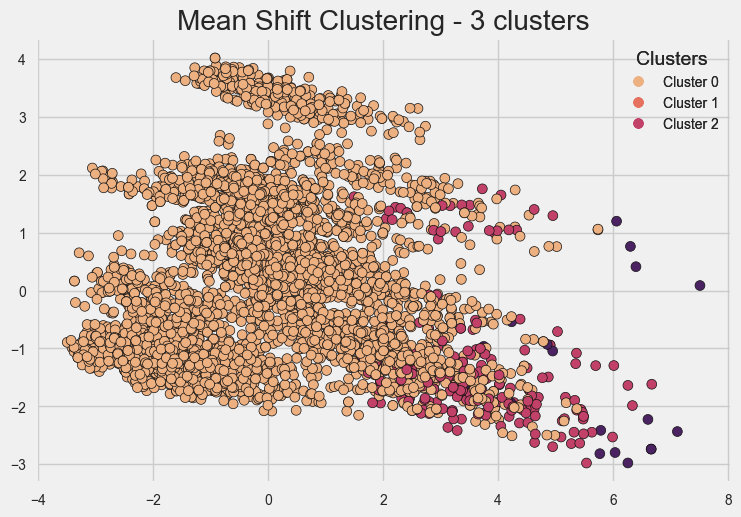

In [271]:
from sklearn.cluster import MeanShift, estimate_bandwidth

bandwidth = estimate_bandwidth(df, quantile=0.2, n_samples=50)

ms = MeanShift(bandwidth=bandwidth)
ms.fit(df)

cluster_centers = ms.cluster_centers_
labels = ms.labels_

n_clusters = len(np.unique(labels))

plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='flare', s=50, edgecolors='k', marker='o')
#plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], c='red', marker='x', s=200, linewidths=3, label='Cluster Centers')

legend_labels = [f'Cluster {i}' for i in range(n_clusters)]
scatter_legend = plt.legend(handles=scatter.legend_elements()[0], title='Clusters', labels=legend_labels)

plt.gca().add_artist(scatter_legend)

plt.title(f'Mean Shift Clustering - {n_clusters} clusters')
plt.show()

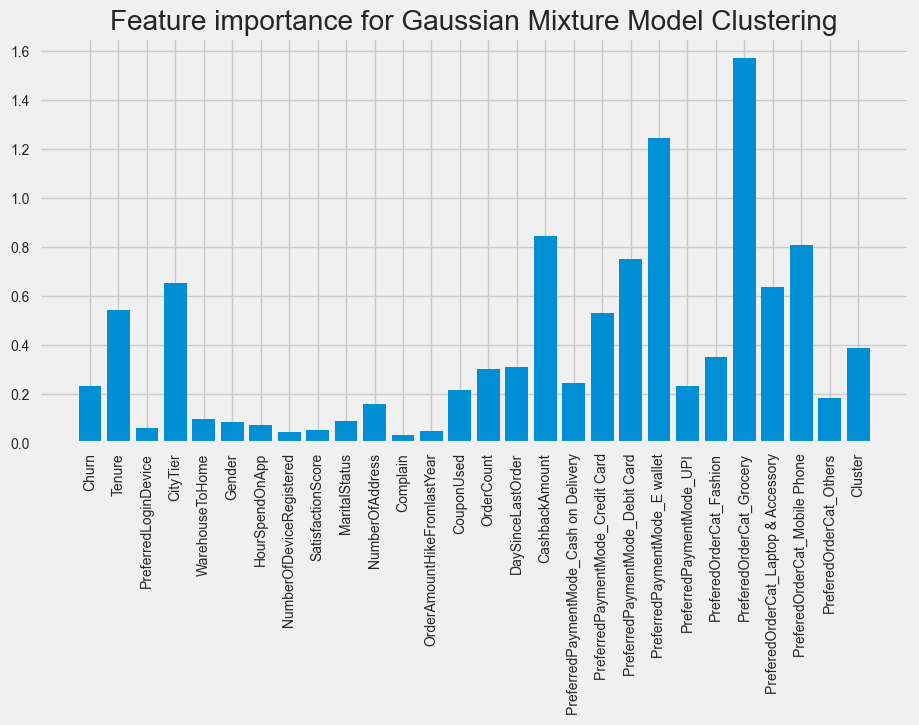

In [272]:
centroids = np.array([df.loc[clusters == label].mean(axis=0) for label in np.unique(clusters)])

feature_importance = centroids.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for Gaussian Mixture Model Clustering')
plt.show()

In [273]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'CityTier', 'OrderCount', 'DaySinceLastOrder',
       'CashbackAmount', 'PreferredPaymentMode_Credit Card',
       'PreferredPaymentMode_Debit Card', 'PreferredPaymentMode_E wallet',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'Cluster'],
      dtype='object')


In [274]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(5)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(5), index=important_columns)

In [275]:
cluster_data

,0,1,2,3,4
Tenure,0.143389,0.131773,-0.403249,1.220634,-0.057214
CityTier,0.054115,-0.061884,-0.407396,-0.076531,1.461987
OrderCount,0.079323,0.176684,-0.289264,0.635341,-0.026478
DaySinceLastOrder,0.264758,0.256204,-0.441765,0.472049,0.017538
CashbackAmount,0.257570,0.299266,-0.748367,1.854603,0.054307
PreferredPaymentMode_Credit Card,-0.679093,0.723934,0.105458,0.072179,-0.679093
PreferredPaymentMode_Debit Card,1.206135,-0.829095,0.051876,0.091875,-0.829095
PreferredPaymentMode_E wallet,-0.354325,-0.354325,-0.354325,-0.052637,2.822272
PreferedOrderCat_Fashion,0.305820,0.358880,-0.420324,-0.420324,0.205799
PreferedOrderCat_Grocery,-0.273185,-0.273185,-0.273185,3.660525,-0.273185


### OPTICS

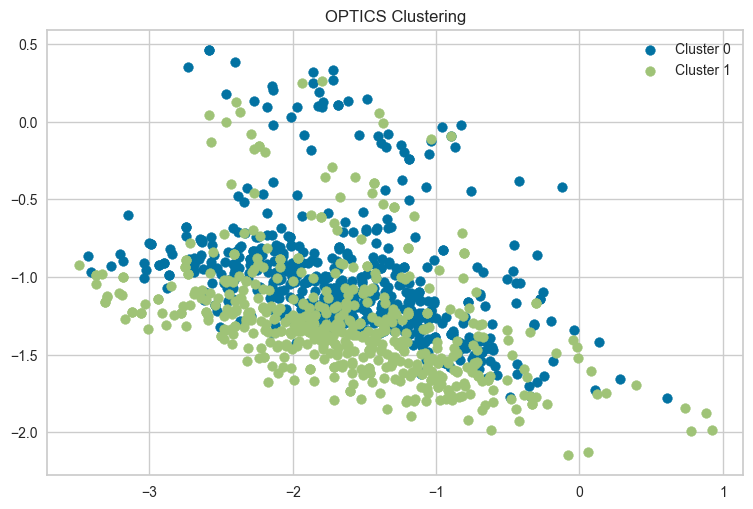

In [181]:
from sklearn.cluster import OPTICS

optics = OPTICS(min_samples=10, xi=0.005, min_cluster_size=0.1)
optics.fit(df)

labels = optics.labels_

unique_labels = set(labels) - {-1}  
n_clusters = len(unique_labels)

for cluster_label in unique_labels:
    cluster_mask = (labels == cluster_label)
    plt.scatter(X_pca[cluster_mask, 0], X_pca[cluster_mask, 1], label=f'Cluster {cluster_label}')

plt.title(f'OPTICS Clustering')
plt.legend()
plt.show()

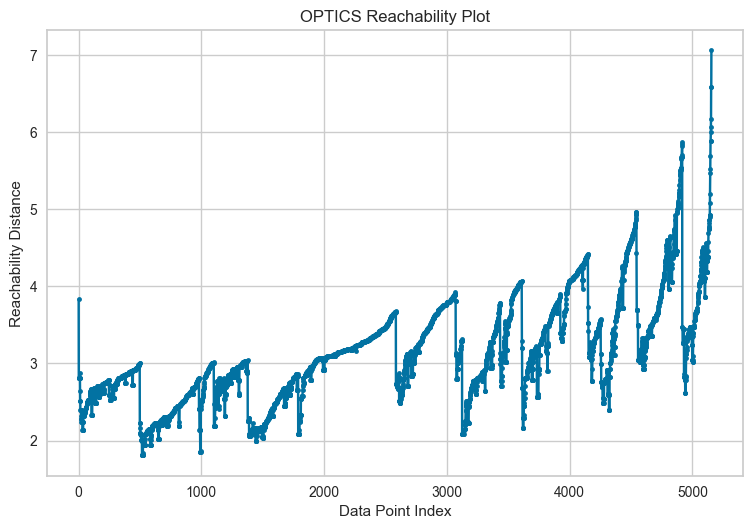

In [182]:
reachability = optics.reachability_[optics.ordering_]
plt.plot(range(len(reachability)), reachability, marker='.')
plt.title('OPTICS Reachability Plot')
plt.xlabel('Data Point Index')
plt.ylabel('Reachability Distance')
plt.show()

In [183]:
df['cluster'] = labels
df_filtered = df[df['cluster'] != -1]
cluster_means = df_filtered.groupby('cluster').mean()

In [184]:
pd.set_option("display.max_columns", None)
pd.set_option("display.width", None)

In [185]:
cluster_means

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,Gender,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,PreferedOrderCat_Fashion,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others
cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,-0.204909,-0.319799,0.151869,-0.507172,-0.333017,0.156383,0.121975,0.020678,-0.155020,0.079223,-0.352752,-0.306506,0.022593,-0.322840,-0.398847,-0.574027,-0.780305,-0.318214,-0.679093,1.206135,-0.354325,-0.2817,-0.420324,-0.273185,-0.757658,1.304524,-0.21855
1,0.015466,-0.477243,0.082635,-0.562966,-0.104760,0.106134,0.107443,-0.031056,0.031831,0.073264,-0.162934,-0.109001,-0.094813,-0.330012,-0.379388,-0.440940,-0.732109,-0.318214,1.472552,-0.829095,-0.354325,-0.2817,-0.420324,-0.273185,-0.757658,1.304524,-0.21855


### Analiza i Biznis plan

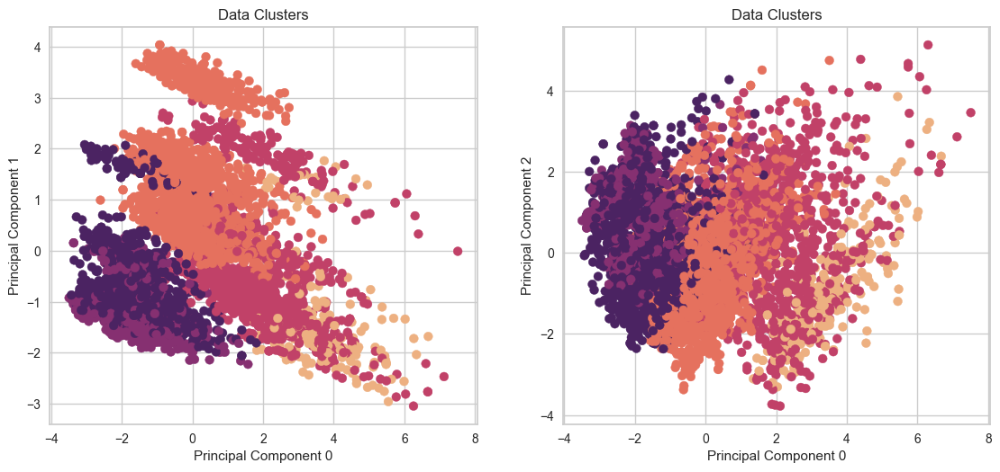

In [187]:
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(df)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='flare', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')

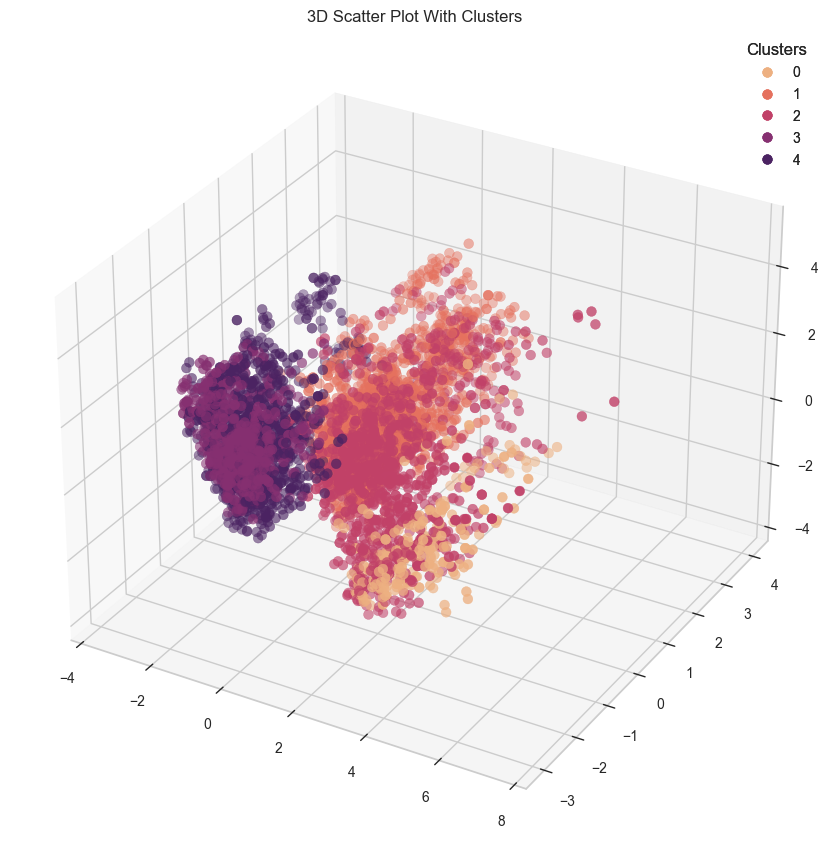

In [188]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='flare', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

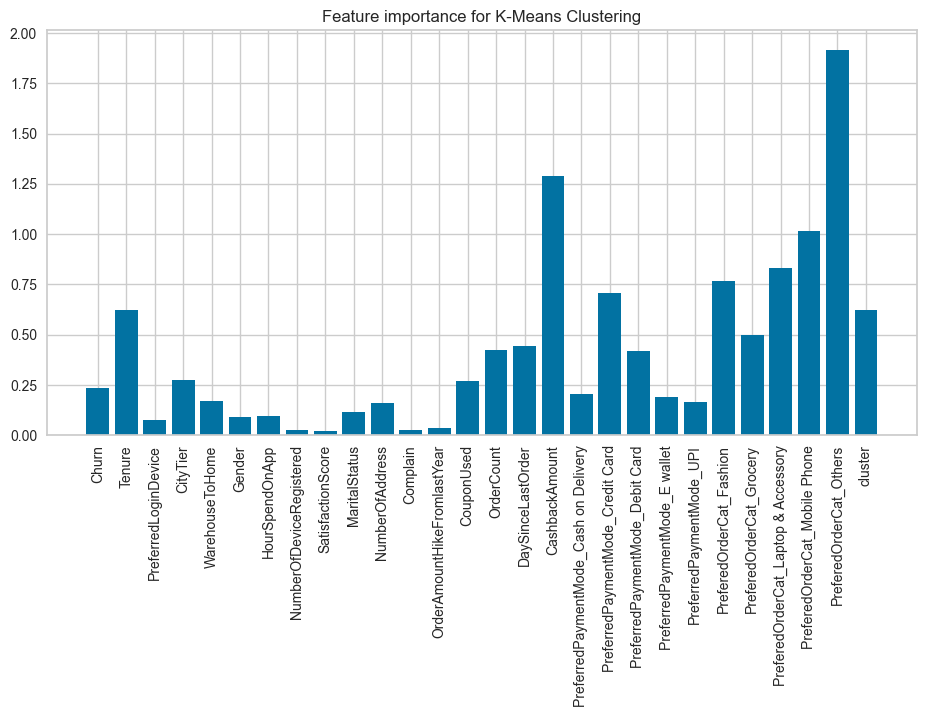

In [190]:
cent = kmeans.cluster_centers_
feature_importance = cent.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for K-Means Clustering')
plt.show()

In [194]:
important_columns = df.columns[feature_importance > 0.2]
print(important_columns)

Index(['Churn', 'Tenure', 'CityTier', 'CouponUsed', 'OrderCount',
       'DaySinceLastOrder', 'CashbackAmount',
       'PreferredPaymentMode_Cash on Delivery',
       'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others', 'cluster'],
      dtype='object')


In [195]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(5)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(5), index=important_columns)

In [196]:
cluster_data

,0,1,2,3,4
Churn,-0.266044,-0.177854,-0.137893,0.157062,0.360971
Tenure,1.192275,-0.066420,0.550925,-0.454172,-0.382277
CityTier,-0.180983,0.312172,0.082721,-0.474445,-0.258831
CouponUsed,0.387476,-0.049778,0.360962,-0.244684,-0.194893
OrderCount,0.754779,-0.074725,0.463455,-0.303450,-0.288328
DaySinceLastOrder,0.655772,0.123277,0.424433,-0.388642,-0.488305
CashbackAmount,2.610031,-0.197821,1.058593,-0.735874,-0.762209
PreferredPaymentMode_Cash on Delivery,-0.200402,-0.058796,0.012547,-0.318214,0.286929
PreferredPaymentMode_Credit Card,0.108317,-0.079698,-0.014559,1.472552,-0.679093
PreferredPaymentMode_Debit Card,-0.049645,-0.008943,-0.005997,-0.829095,0.474699


Klaster 0 - Korisnici sa izuzetno dužim iskustvom, većim brojem porudžbina, koriste kupone, veći period od poslednje porudžbine, značajno većim povraćajem novca, preferiraju kategoriju Others i uglavnom plaćaju karticom.

Klaster 1 - Korisnici sa kratkim iskustvom, srednjim brojem porudžbina, ne koriste kupone, kraći period od poslednje porudžbine, malim povraćajem novca, preferiraju kategoriju Laptop i slabo plaćaju karticom.

Klaster 2 - Korisnici sa dužim iskustvom, većim brojem porudžbina, koriste kupone, veći period od poslednje porudžbine, većim povraćajem novca, preferiraju kategoriju Fashion (i Grocery) i češće plaćaju kešom.

Klaster 3 - Korisnici sa kratkim iskustvom, manjim brojem porudžbina, ne koriste kupone, kraći period od poslednje porudžbine, malim povraćajem novca, preferiraju kategoriju Mobile Phone i najčešće plaćaju kreditnom karticom.

Klaster 4 - Korisnici sa kratkim iskustvom, manjim brojem porudžbina, ne koriste kupone, kraći period od poslednje porudžbine, malim povraćajem novca, preferiraju kategoriju Mobile Phone i najčešće plaćaju kešom ili debitnom karticom.

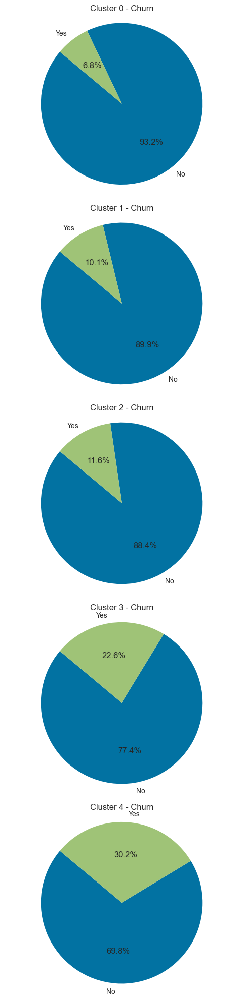

In [209]:
df['Cluster'] = clusters

# Plot pie charts for each feature within each cluster
for feature in ['Churn']:
    plt.figure(figsize=(5, 4 * len(np.unique(clusters))))
    for i, cluster_label in enumerate(np.unique(clusters), 1):
        cluster_data = df[df['Cluster'] == cluster_label][feature]
        feature_counts = cluster_data.value_counts()
        sorted_counts = feature_counts.sort_values(ascending=False)
        labels = ['No', 'Yes'] if len(sorted_counts) >= 2 else [str(sorted_counts.index[0]), str(sorted_counts.index[1])]  
        plt.subplot(len(np.unique(clusters)), 1, i)
        plt.pie(sorted_counts, labels=labels, autopct='%1.1f%%', startangle=140)
        plt.title(f'Cluster {cluster_label} - {feature}')
        plt.axis('equal')
    plt.tight_layout()
    plt.show()


Zaključak: najveć tendenciju za prestanak koršćenja usluga kompanije imaju poslednja dva kalstera - Klaster 3 i 4. Dakle, najkritičniji su korisnici koji kraće koriste usluge neke kompanije i kupuju mobilne telefone, bez obzira na način plaćanja.Stoga, trebalo bi veću pažnju posvetiti marketingu ovih proizvoda, kao i razmatranju uvodjenja eventualnih benefita, poput: programa lojalosti, personalizacije ponude, posebnih popusta itd.

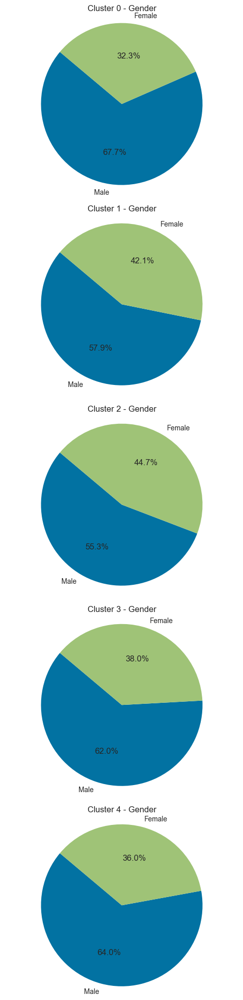

In [211]:
# Plot pie charts for each feature within each cluster
for feature in ['Gender']:
    plt.figure(figsize=(5, 4 * len(np.unique(clusters))))
    for i, cluster_label in enumerate(np.unique(clusters), 1):
        cluster_data = df[df['Cluster'] == cluster_label][feature]
        feature_counts = cluster_data.value_counts()
        sorted_counts = feature_counts.sort_values(ascending=False)
        labels = ['Male', 'Female'] if len(sorted_counts) >= 2 else [str(sorted_counts.index[0]), str(sorted_counts.index[1])]  
        plt.subplot(len(np.unique(clusters)), 1, i)
        plt.pie(sorted_counts, labels=labels, autopct='%1.1f%%', startangle=140)
        plt.title(f'Cluster {cluster_label} - {feature}')
        plt.axis('equal')
    plt.tight_layout()
    plt.show()

Zakljucak za muskarce: 
Muški korisnici u Klasteru 0 predstavljaju važnu demografsku grupu kojoj kompanija treba posvetiti posebnu pažnju. Visoka stopa dugotrajnog angažovanja ovih korisnika ukazuje na njihovu lojalnost, ali istovremeno i potrebu za dodatnim naporima u održavanju njihovog interesovanja i zadovoljstva. Stoga je ključno implementirati ciljane marketinške strategije usmerene ka ovoj grupi, kao i kontinuirano unapređivati korisničko iskustvo kako bi se osiguralo dugoročno zadržavanje i lojalnost ovih muških korisnika. Ovo može uključivati personalizaciju ponuda, poboljšanje korisničke podrške, dodatne beneficije ili pogodnosti prilagođene njihovim potrebama, kao i kontinuirano praćenje povratnih informacija radi prilagođavanja marketinških strategija.

Zakljucak za zene:
Ženski korisnici u Klasteru 2 predstavljaju značajnu demografsku grupu koja pokazuje određenu vernost prema kompaniji, što je reflektovano njihovim dužim iskustvom i većim brojem porudžbina. Da bi se održala ova lojalnost i unapredilo korisničko iskustvo, ključno je usmeriti marketinške strategije na personalizaciju ponuda, poboljšanje usluga podrške i razmatranje dodatnih beneficija koje bi privukle ove korisnice. Pracenje povratnih informacija i prilagođavanje marketinških strategija u skladu sa potrebama i preferencijama ovih korisnica može doprineti dugoročnom zadovoljstvu i lojalnosti.


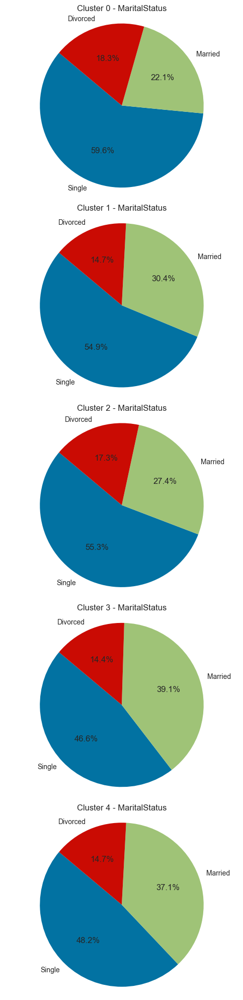

In [215]:
# Plot pie charts for each feature within each cluster
for feature in ['MaritalStatus']:
    plt.figure(figsize=(5, 4 * len(np.unique(clusters))))
    for i, cluster_label in enumerate(np.unique(clusters), 1):
        cluster_data = df[df['Cluster'] == cluster_label][feature]
        feature_counts = cluster_data.value_counts()
        sorted_counts = feature_counts.sort_values(ascending=False)
        labels = ['Single', 'Married', 'Divorced'] if len(sorted_counts) >= 2 else [str(sorted_counts.index[0]), str(sorted_counts.index[1])]  
        plt.subplot(len(np.unique(clusters)), 1, i)
        plt.pie(sorted_counts, labels=labels, autopct='%1.1f%%', startangle=140)
        plt.title(f'Cluster {cluster_label} - {feature}')
        plt.axis('equal')
    plt.tight_layout()
    plt.show()

Zakljucak za single:
Korisnici koji su single, a čine najveći deo u Klasteru 0 sa oko 60%, predstavljaju  grupu koja se ističe po dugotrajnom iskustvu, visokom broju porudžbina, redovnom korišćenju kupona, prošlom dužem periodu od poslednje porudžbine, značajnim povratkom novca, preferiranju kategorije "Others" i dominantnom korišćenju kartičnog plaćanja. Ovo ukazuje na njihovu stabilnost i aktivno učešće u korišćenju usluga kompanije. Da bi se očuvala njihova lojalnost i unapredilo korisničko iskustvo, ključno je usmeriti marketinške strategije na personalizaciju ponuda, poboljšanje usluga podrške i razmatranje dodatnih beneficija koje bi privukle ove korisnike. Pracenje povratnih informacija i prilagođavanje marketinških strategija u skladu sa njihovim potrebama i preferencijama može doprineti dugoročnom zadovoljstvu i lojalnosti u Klasteru 0.

Zakljucak za married: Married korisnici, koji čine oko 39% korisnika u Klasteru 3, predstavljaju grupu koja se ističe po kraćem iskustvu korišćenja usluga kompanije, manjem broju porudžbina, nekorišćenju kupona, kraćem periodu od poslednje porudžbine, manjem povratku novca, preferiranju kategorije "Mobile Phone" i najčešćem plaćanju kreditnom karticom. Ovo ukazuje na potrebu za razmatranjem posebnih marketinških strategija koje bi se prilagodile potrebama i preferencijama ove demografske grupe. Poboljšanje korisničkog iskustva, uvođenje personalizovanih ponuda ili beneficija i fokusiranje na zadovoljenje specifičnih potreba ovih korisnika moglo bi pomoći u povećanju njihove lojalnosti i dugoročnom zadržavanju u Klasteru 3.

Zakljucak za divorced: klaster 0, oko 18%, kao i za single...